In [4]:
from scipy.io import arff
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
from sklearn.model_selection import train_test_split
import os
from sklearn.model_selection import cross_val_score

# Preprocessing

In [27]:
data = pd.read_excel("./data/credit/credit.xlsx")
data = data.drop(columns=['ID','SEX', 'EDUCATION', 'MARRIAGE'])

In [29]:
data_cols = list(data.columns[ data.columns != 'default payment next month' ])
label_cols = ['default payment next month']

In [30]:
data['default payment next month'].value_counts()

0    23364
1     6636
Name: default payment next month, dtype: int64

In [37]:
# Subsampling
df0 = data[data['default payment next month'] == 0].sample(6636)
df1 = data[data['default payment next month'] == 1]
df = pd.concat([df0,df1], ignore_index=True)
data = df.copy()

In [41]:
data.shape

(13272, 21)

In [42]:
#Standardize columns
data[data_cols] = StandardScaler().fit_transform(data[data_cols])

In [44]:
def xgbo_cv(X,y):
    xg_reg = xgb.XGBClassifier(object="binary:logistic")
    
    print('Accuracy XGBoost CV:  '+ np.str(cross_val_score(xg_reg, X,y, cv=5, scoring='accuracy', n_jobs=-1).mean()))
    print('F1-Score XGBoost CV:  '+ np.str(cross_val_score(xg_reg, X,y, cv=5, scoring='f1', n_jobs=-1).mean()))
    print('ROC AUC XGBoost CV:  '+ np.str(cross_val_score(xg_reg, X,y, cv=5, scoring = 'roc_auc', n_jobs=-1).mean()))

# GAN setup and training

In [51]:
import CGAN

# For reloading after making changes
import importlib
importlib.reload(CGAN) 
from CGAN import *


rand_dim = 100 
base_n_count = 

nb_steps = 50000 + 1 # 50000 # Add one for logging of the last interval
batch_size = 64 

k_d = 1  # number of critic network updates per adversarial training step
k_g = 1  # number of generator network updates per adversarial training step
critic_pre_train_steps = 100   # number of steps to pre-train the critic before starting adversarial training
log_interval = 100  # interval (in steps) at which to log loss summaries and save plots of image samples to disc
learning_rate = 5e-5 
data_dir = './cache/credit_balanced/'
generator_model_path, discriminator_model_path, loss_pickle_path = None, None, None

show = True 

train = data.copy().reset_index(drop=True) 

train[ data_cols ] = train[ data_cols ] / 10 # scale to random noise size, one less thing to learn
train_no_label = train[ data_cols ]

data_dim:  20
data_cols:  ['LIMIT_BAL', 'AGE', 'PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']
label_dim:  1
label_cols:  ['default payment next month']
Instructions for updating:
Colocations handled automatically by placer.
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 100)          0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 1)            0                                            
__________________________________________________________________________________________________
concatenate_1 (Concatenat

C:\Programas\Anaconda3\lib\site-packages\keras\engine\training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Instructions for updating:
Use tf.cast instead.
Step: 0 of 50001.
Losses: G, D Gen, D Real: 0.6959, 0.6910, 0.6744
D Real - D Gen: -0.0167


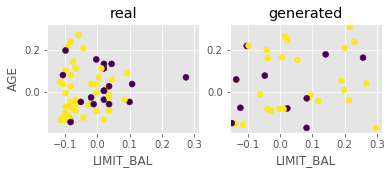

Step: 100 of 50001.
Losses: G, D Gen, D Real: 0.7275, 0.6465, 0.6553
D Real - D Gen: 0.0088


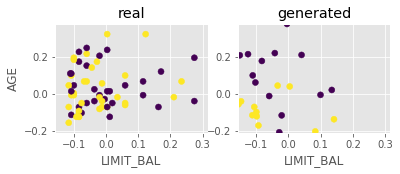

Step: 200 of 50001.
Losses: G, D Gen, D Real: 0.6727, 0.6910, 0.6526
D Real - D Gen: -0.0384


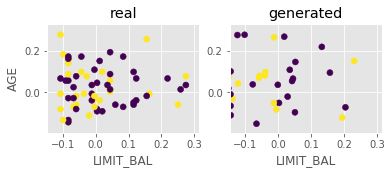

Step: 300 of 50001.
Losses: G, D Gen, D Real: 0.6634, 0.7068, 0.6689
D Real - D Gen: -0.0379


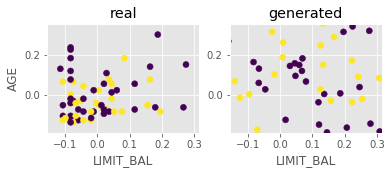

Step: 400 of 50001.
Losses: G, D Gen, D Real: 0.7056, 0.6570, 0.6668
D Real - D Gen: 0.0098


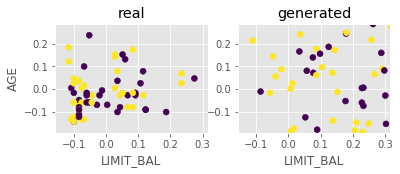

Step: 500 of 50001.
Losses: G, D Gen, D Real: 0.7332, 0.6380, 0.6576
D Real - D Gen: 0.0196


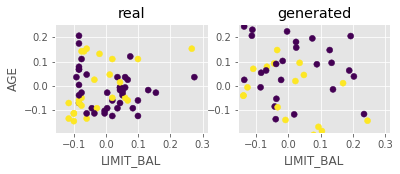

Step: 600 of 50001.
Losses: G, D Gen, D Real: 0.7062, 0.6399, 0.6300
D Real - D Gen: -0.0099


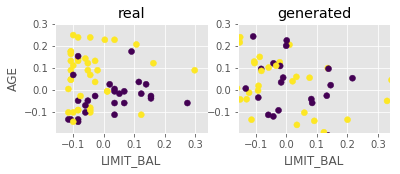

Step: 700 of 50001.
Losses: G, D Gen, D Real: 0.6920, 0.6640, 0.6385
D Real - D Gen: -0.0255


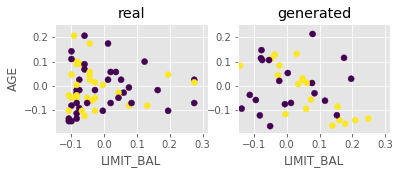

Step: 800 of 50001.
Losses: G, D Gen, D Real: 0.7025, 0.6260, 0.6437
D Real - D Gen: 0.0177


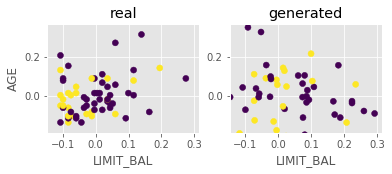

Step: 900 of 50001.
Losses: G, D Gen, D Real: 0.6721, 0.6744, 0.6370
D Real - D Gen: -0.0374


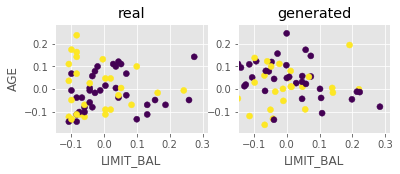

Step: 1000 of 50001.
Losses: G, D Gen, D Real: 0.6868, 0.6247, 0.6423
D Real - D Gen: 0.0177


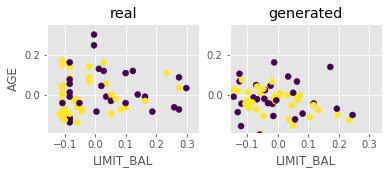

Step: 1100 of 50001.
Losses: G, D Gen, D Real: 0.7132, 0.6598, 0.6361
D Real - D Gen: -0.0237


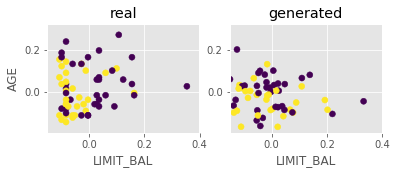

Step: 1200 of 50001.
Losses: G, D Gen, D Real: 0.6624, 0.6610, 0.6388
D Real - D Gen: -0.0222


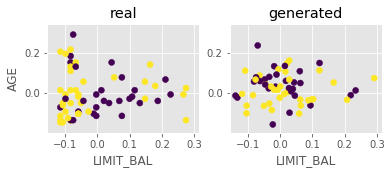

Step: 1300 of 50001.
Losses: G, D Gen, D Real: 0.7064, 0.6540, 0.6423
D Real - D Gen: -0.0117


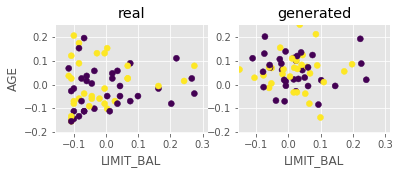

Step: 1400 of 50001.
Losses: G, D Gen, D Real: 0.6410, 0.6819, 0.6532
D Real - D Gen: -0.0287


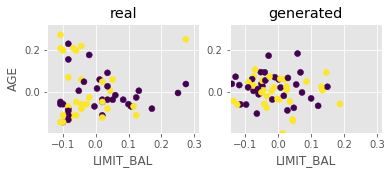

Step: 1500 of 50001.
Losses: G, D Gen, D Real: 0.7522, 0.6463, 0.6497
D Real - D Gen: 0.0034


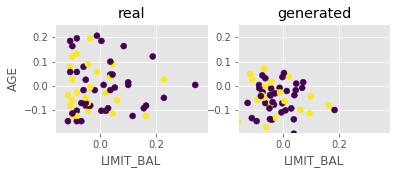

Step: 1600 of 50001.
Losses: G, D Gen, D Real: 0.6494, 0.6743, 0.6321
D Real - D Gen: -0.0422


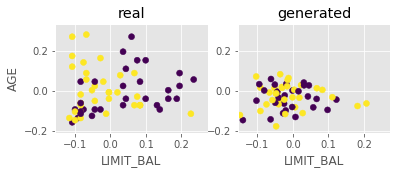

Step: 1700 of 50001.
Losses: G, D Gen, D Real: 0.6870, 0.6824, 0.6696
D Real - D Gen: -0.0128


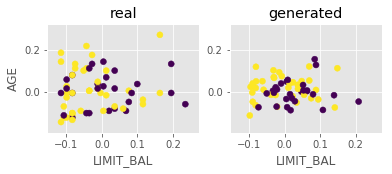

Step: 1800 of 50001.
Losses: G, D Gen, D Real: 0.6633, 0.6637, 0.6421
D Real - D Gen: -0.0216


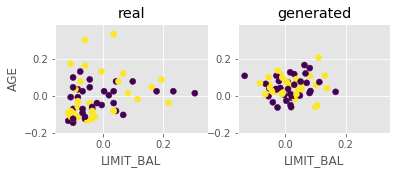

Step: 1900 of 50001.
Losses: G, D Gen, D Real: 0.6792, 0.6936, 0.6644
D Real - D Gen: -0.0292


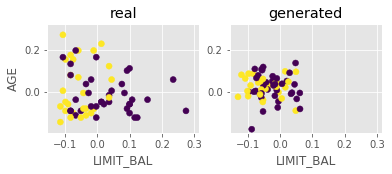

Step: 2000 of 50001.
Losses: G, D Gen, D Real: 0.6562, 0.6559, 0.6541
D Real - D Gen: -0.0018


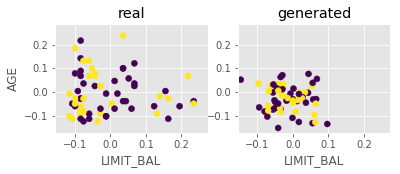

Step: 2100 of 50001.
Losses: G, D Gen, D Real: 0.6881, 0.6830, 0.6876
D Real - D Gen: 0.0045


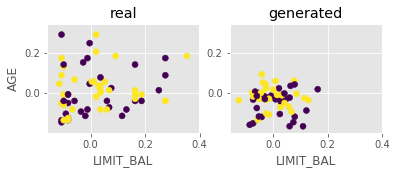

Step: 2200 of 50001.
Losses: G, D Gen, D Real: 0.6501, 0.6727, 0.6369
D Real - D Gen: -0.0358


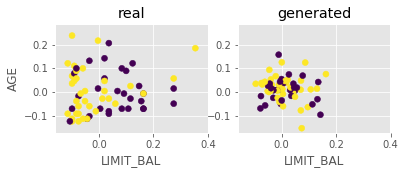

Step: 2300 of 50001.
Losses: G, D Gen, D Real: 0.6692, 0.6861, 0.6445
D Real - D Gen: -0.0416


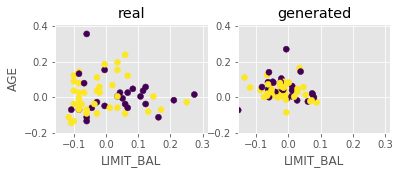

Step: 2400 of 50001.
Losses: G, D Gen, D Real: 0.6425, 0.6823, 0.6353
D Real - D Gen: -0.0470


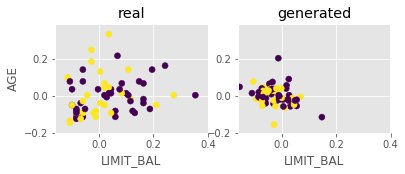

Step: 2500 of 50001.
Losses: G, D Gen, D Real: 0.6711, 0.6986, 0.6571
D Real - D Gen: -0.0415


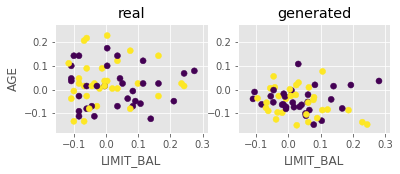

Step: 2600 of 50001.
Losses: G, D Gen, D Real: 0.6783, 0.6712, 0.6384
D Real - D Gen: -0.0327


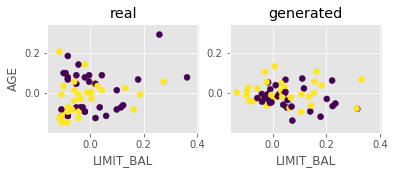

Step: 2700 of 50001.
Losses: G, D Gen, D Real: 0.7294, 0.6651, 0.6667
D Real - D Gen: 0.0016


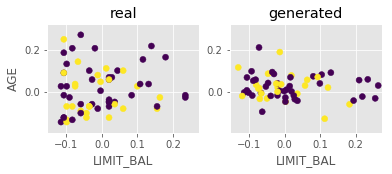

Step: 2800 of 50001.
Losses: G, D Gen, D Real: 0.6539, 0.6889, 0.6767
D Real - D Gen: -0.0122


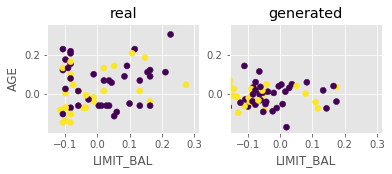

Step: 2900 of 50001.
Losses: G, D Gen, D Real: 0.6426, 0.6785, 0.6778
D Real - D Gen: -0.0008


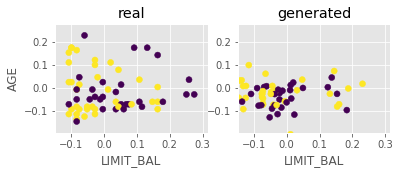

Step: 3000 of 50001.
Losses: G, D Gen, D Real: 0.6566, 0.7042, 0.6883
D Real - D Gen: -0.0159


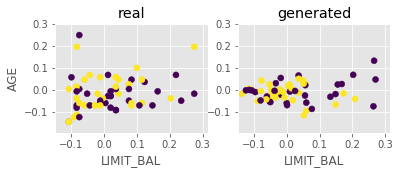

Step: 3100 of 50001.
Losses: G, D Gen, D Real: 0.6173, 0.6911, 0.6511
D Real - D Gen: -0.0400


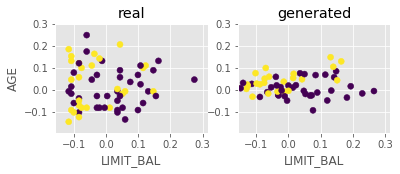

Step: 3200 of 50001.
Losses: G, D Gen, D Real: 0.6655, 0.6739, 0.6951
D Real - D Gen: 0.0212


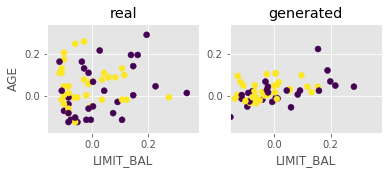

Step: 3300 of 50001.
Losses: G, D Gen, D Real: 0.6438, 0.6799, 0.6887
D Real - D Gen: 0.0089


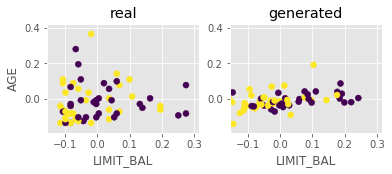

Step: 3400 of 50001.
Losses: G, D Gen, D Real: 0.6516, 0.6909, 0.7008
D Real - D Gen: 0.0100


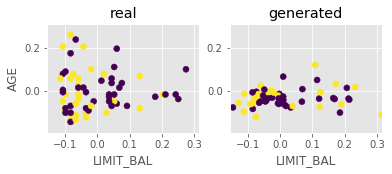

Step: 3500 of 50001.
Losses: G, D Gen, D Real: 0.6505, 0.6758, 0.6876
D Real - D Gen: 0.0119


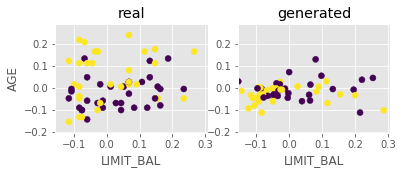

Step: 3600 of 50001.
Losses: G, D Gen, D Real: 0.6852, 0.6817, 0.6806
D Real - D Gen: -0.0011


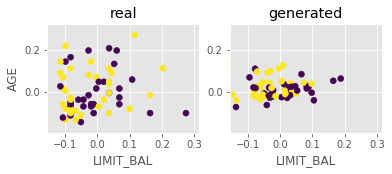

Step: 3700 of 50001.
Losses: G, D Gen, D Real: 0.6477, 0.6878, 0.6741
D Real - D Gen: -0.0137


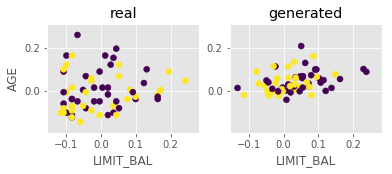

Step: 3800 of 50001.
Losses: G, D Gen, D Real: 0.6790, 0.6795, 0.6800
D Real - D Gen: 0.0006


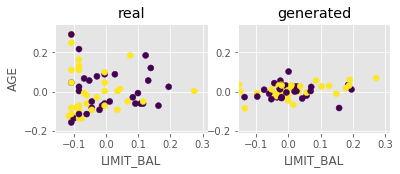

Step: 3900 of 50001.
Losses: G, D Gen, D Real: 0.6456, 0.6712, 0.7060
D Real - D Gen: 0.0348


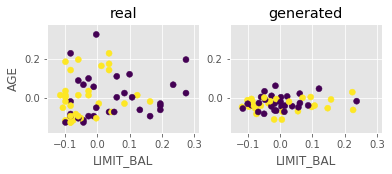

Step: 4000 of 50001.
Losses: G, D Gen, D Real: 0.6947, 0.6645, 0.7004
D Real - D Gen: 0.0359


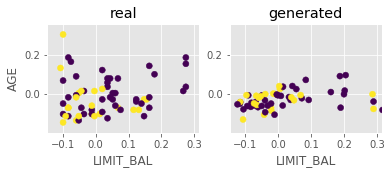

Step: 4100 of 50001.
Losses: G, D Gen, D Real: 0.6591, 0.6674, 0.6908
D Real - D Gen: 0.0234


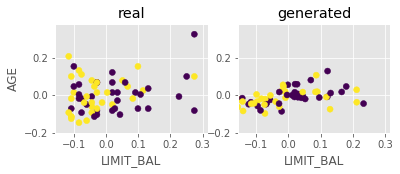

Step: 4200 of 50001.
Losses: G, D Gen, D Real: 0.6996, 0.6827, 0.6881
D Real - D Gen: 0.0055


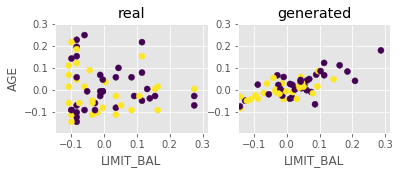

Step: 4300 of 50001.
Losses: G, D Gen, D Real: 0.6678, 0.6896, 0.6844
D Real - D Gen: -0.0052


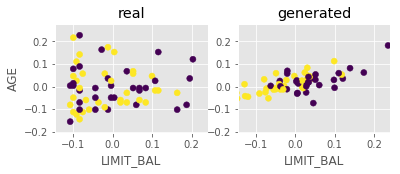

Step: 4400 of 50001.
Losses: G, D Gen, D Real: 0.6812, 0.6780, 0.6856
D Real - D Gen: 0.0076


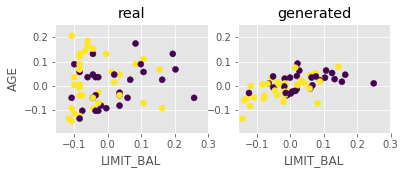

Step: 4500 of 50001.
Losses: G, D Gen, D Real: 0.6618, 0.6809, 0.6849
D Real - D Gen: 0.0040


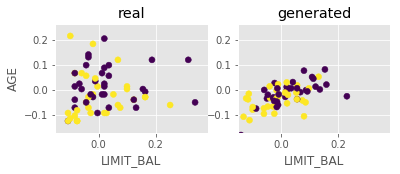

Step: 4600 of 50001.
Losses: G, D Gen, D Real: 0.6939, 0.6815, 0.6848
D Real - D Gen: 0.0033


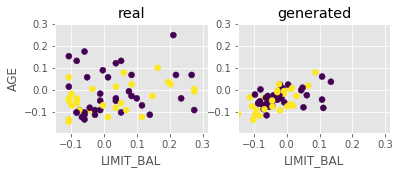

Step: 4700 of 50001.
Losses: G, D Gen, D Real: 0.6436, 0.6680, 0.7097
D Real - D Gen: 0.0416


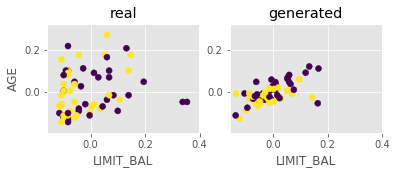

Step: 4800 of 50001.
Losses: G, D Gen, D Real: 0.6975, 0.6753, 0.6857
D Real - D Gen: 0.0105


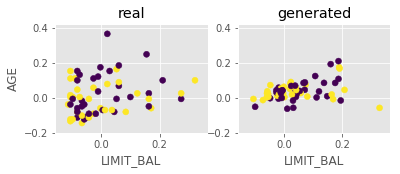

Step: 4900 of 50001.
Losses: G, D Gen, D Real: 0.6752, 0.6749, 0.6961
D Real - D Gen: 0.0212


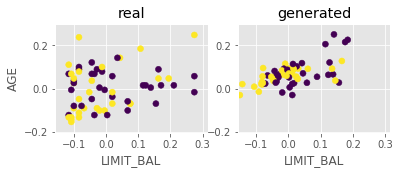

Step: 5000 of 50001.
Losses: G, D Gen, D Real: 0.7094, 0.6778, 0.7028
D Real - D Gen: 0.0250


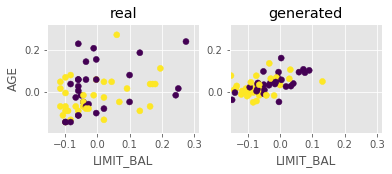

Step: 5100 of 50001.
Losses: G, D Gen, D Real: 0.6504, 0.6946, 0.6774
D Real - D Gen: -0.0172


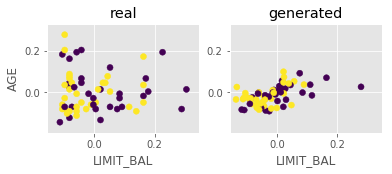

Step: 5200 of 50001.
Losses: G, D Gen, D Real: 0.6965, 0.6926, 0.6735
D Real - D Gen: -0.0191


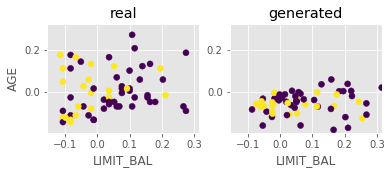

Step: 5300 of 50001.
Losses: G, D Gen, D Real: 0.6840, 0.6801, 0.6564
D Real - D Gen: -0.0237


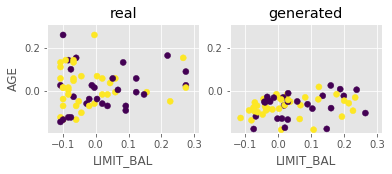

Step: 5400 of 50001.
Losses: G, D Gen, D Real: 0.7112, 0.6953, 0.6771
D Real - D Gen: -0.0182


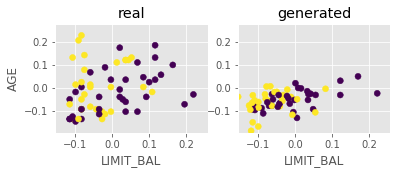

Step: 5500 of 50001.
Losses: G, D Gen, D Real: 0.6572, 0.6748, 0.6982
D Real - D Gen: 0.0234


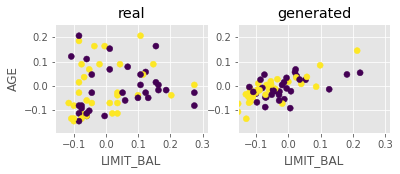

Step: 5600 of 50001.
Losses: G, D Gen, D Real: 0.6922, 0.6971, 0.6825
D Real - D Gen: -0.0146


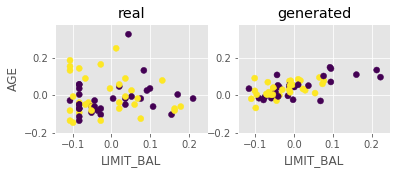

Step: 5700 of 50001.
Losses: G, D Gen, D Real: 0.6747, 0.6740, 0.7087
D Real - D Gen: 0.0347


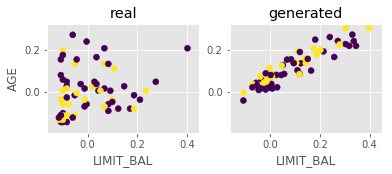

Step: 5800 of 50001.
Losses: G, D Gen, D Real: 0.6477, 0.6696, 0.6685
D Real - D Gen: -0.0011


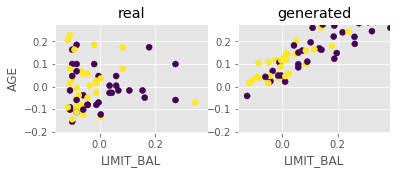

Step: 5900 of 50001.
Losses: G, D Gen, D Real: 0.6507, 0.7023, 0.6637
D Real - D Gen: -0.0386


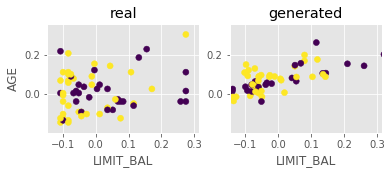

Step: 6000 of 50001.
Losses: G, D Gen, D Real: 0.6161, 0.6991, 0.6413
D Real - D Gen: -0.0578


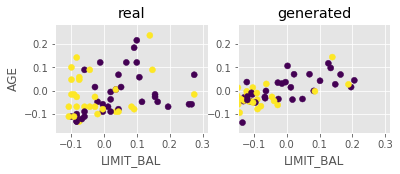

Step: 6100 of 50001.
Losses: G, D Gen, D Real: 0.6452, 0.7185, 0.6821
D Real - D Gen: -0.0365


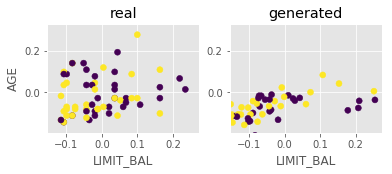

Step: 6200 of 50001.
Losses: G, D Gen, D Real: 0.6444, 0.7005, 0.6830
D Real - D Gen: -0.0175


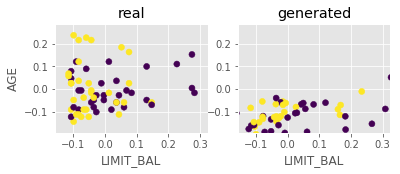

Step: 6300 of 50001.
Losses: G, D Gen, D Real: 0.6716, 0.6835, 0.6845
D Real - D Gen: 0.0010


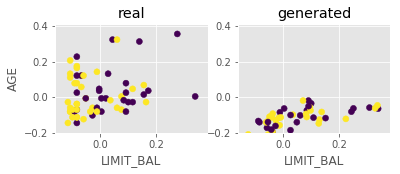

Step: 6400 of 50001.
Losses: G, D Gen, D Real: 0.6574, 0.6625, 0.6831
D Real - D Gen: 0.0206


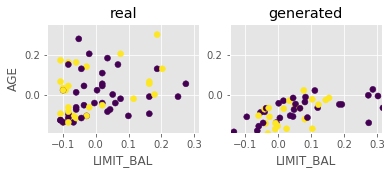

Step: 6500 of 50001.
Losses: G, D Gen, D Real: 0.6842, 0.6627, 0.6856
D Real - D Gen: 0.0229


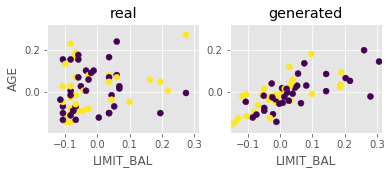

Step: 6600 of 50001.
Losses: G, D Gen, D Real: 0.6438, 0.6966, 0.6912
D Real - D Gen: -0.0054


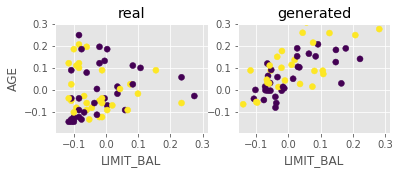

Step: 6700 of 50001.
Losses: G, D Gen, D Real: 0.6691, 0.7164, 0.6889
D Real - D Gen: -0.0276


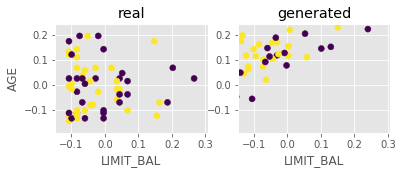

Step: 6800 of 50001.
Losses: G, D Gen, D Real: 0.6521, 0.6977, 0.6898
D Real - D Gen: -0.0079


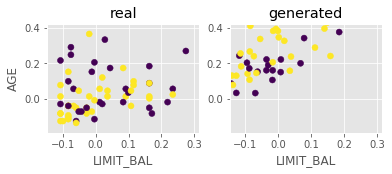

Step: 6900 of 50001.
Losses: G, D Gen, D Real: 0.7040, 0.6547, 0.6777
D Real - D Gen: 0.0230


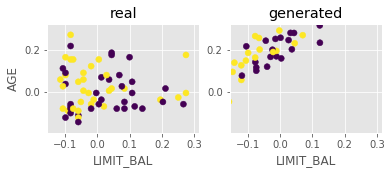

Step: 7000 of 50001.
Losses: G, D Gen, D Real: 0.6966, 0.6496, 0.6670
D Real - D Gen: 0.0173


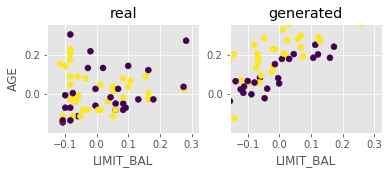

Step: 7100 of 50001.
Losses: G, D Gen, D Real: 0.6831, 0.6810, 0.6739
D Real - D Gen: -0.0071


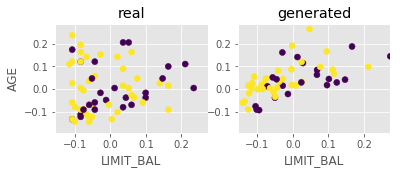

Step: 7200 of 50001.
Losses: G, D Gen, D Real: 0.6173, 0.7321, 0.6855
D Real - D Gen: -0.0466


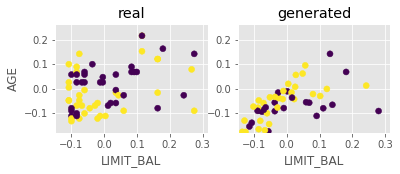

Step: 7300 of 50001.
Losses: G, D Gen, D Real: 0.6185, 0.7615, 0.6856
D Real - D Gen: -0.0759


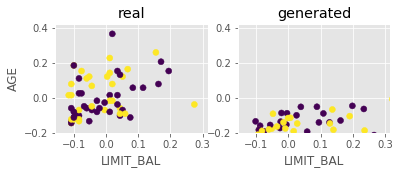

Step: 7400 of 50001.
Losses: G, D Gen, D Real: 0.6200, 0.7339, 0.6952
D Real - D Gen: -0.0387


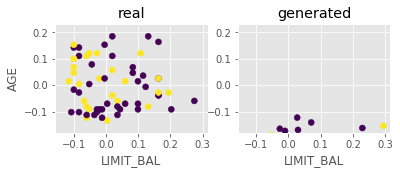

Step: 7500 of 50001.
Losses: G, D Gen, D Real: 0.7105, 0.6536, 0.6980
D Real - D Gen: 0.0444


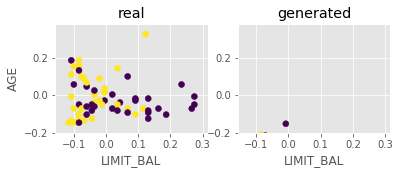

Step: 7600 of 50001.
Losses: G, D Gen, D Real: 0.7317, 0.6116, 0.6568
D Real - D Gen: 0.0451


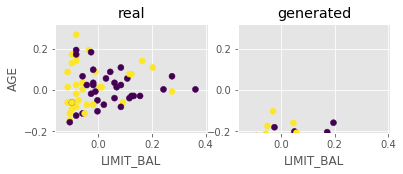

Step: 7700 of 50001.
Losses: G, D Gen, D Real: 0.7554, 0.6336, 0.6562
D Real - D Gen: 0.0226


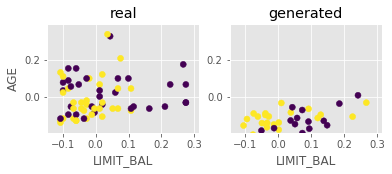

Step: 7800 of 50001.
Losses: G, D Gen, D Real: 0.6732, 0.6624, 0.6886
D Real - D Gen: 0.0263


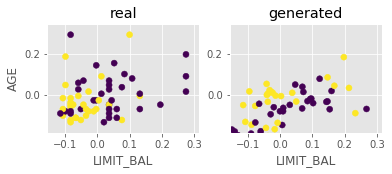

Step: 7900 of 50001.
Losses: G, D Gen, D Real: 0.6334, 0.7390, 0.6712
D Real - D Gen: -0.0679


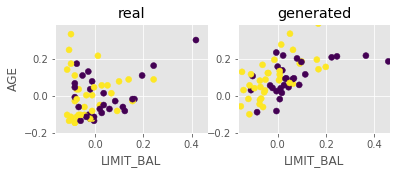

Step: 8000 of 50001.
Losses: G, D Gen, D Real: 0.5752, 0.7842, 0.6730
D Real - D Gen: -0.1113


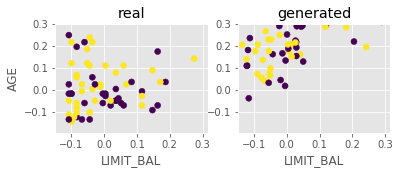

Step: 8100 of 50001.
Losses: G, D Gen, D Real: 0.6058, 0.7792, 0.6565
D Real - D Gen: -0.1227


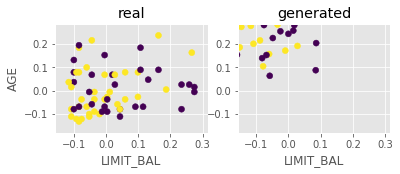

Step: 8200 of 50001.
Losses: G, D Gen, D Real: 0.6381, 0.7148, 0.6464
D Real - D Gen: -0.0684


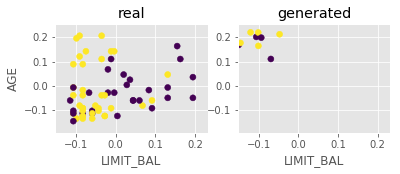

Step: 8300 of 50001.
Losses: G, D Gen, D Real: 0.7452, 0.6436, 0.6669
D Real - D Gen: 0.0233


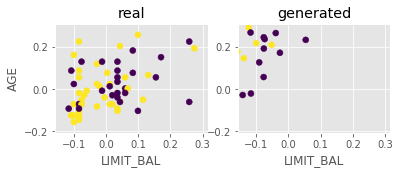

Step: 8400 of 50001.
Losses: G, D Gen, D Real: 0.7219, 0.6323, 0.6344
D Real - D Gen: 0.0021


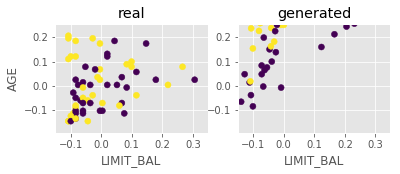

Step: 8500 of 50001.
Losses: G, D Gen, D Real: 0.6223, 0.7015, 0.6552
D Real - D Gen: -0.0463


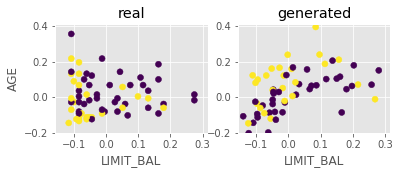

Step: 8600 of 50001.
Losses: G, D Gen, D Real: 0.6104, 0.7325, 0.6884
D Real - D Gen: -0.0442


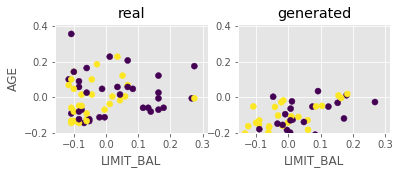

Step: 8700 of 50001.
Losses: G, D Gen, D Real: 0.5940, 0.7389, 0.6902
D Real - D Gen: -0.0486


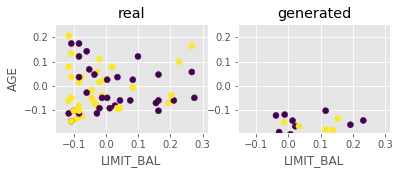

Step: 8800 of 50001.
Losses: G, D Gen, D Real: 0.6645, 0.7090, 0.6908
D Real - D Gen: -0.0182


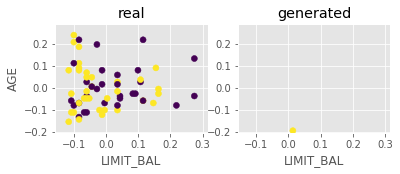

Step: 8900 of 50001.
Losses: G, D Gen, D Real: 0.7186, 0.6332, 0.6783
D Real - D Gen: 0.0451


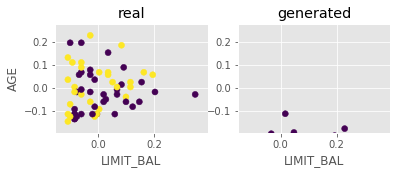

Step: 9000 of 50001.
Losses: G, D Gen, D Real: 0.7313, 0.6297, 0.6646
D Real - D Gen: 0.0349


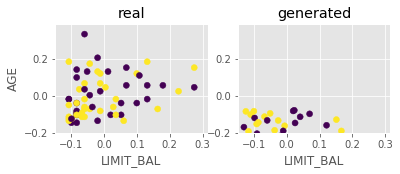

Step: 9100 of 50001.
Losses: G, D Gen, D Real: 0.6573, 0.6705, 0.6513
D Real - D Gen: -0.0192


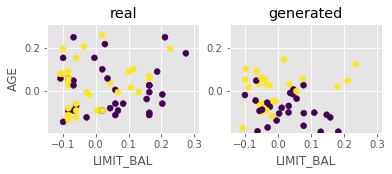

Step: 9200 of 50001.
Losses: G, D Gen, D Real: 0.6172, 0.7523, 0.6641
D Real - D Gen: -0.0882


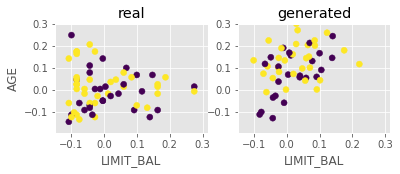

Step: 9300 of 50001.
Losses: G, D Gen, D Real: 0.6037, 0.7436, 0.6699
D Real - D Gen: -0.0737


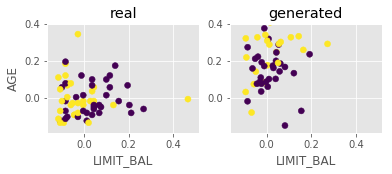

Step: 9400 of 50001.
Losses: G, D Gen, D Real: 0.6523, 0.7159, 0.6650
D Real - D Gen: -0.0509


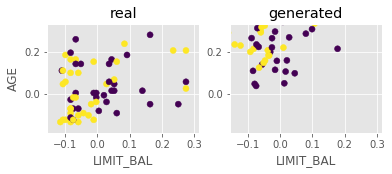

Step: 9500 of 50001.
Losses: G, D Gen, D Real: 0.6951, 0.6602, 0.6504
D Real - D Gen: -0.0098


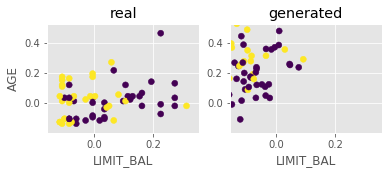

Step: 9600 of 50001.
Losses: G, D Gen, D Real: 0.6934, 0.6649, 0.6504
D Real - D Gen: -0.0145


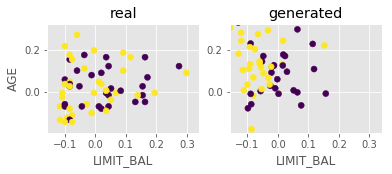

Step: 9700 of 50001.
Losses: G, D Gen, D Real: 0.6481, 0.6960, 0.6685
D Real - D Gen: -0.0274


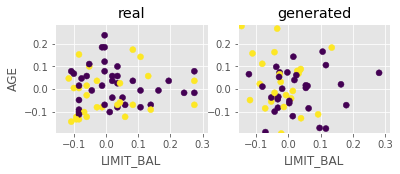

Step: 9800 of 50001.
Losses: G, D Gen, D Real: 0.6464, 0.7222, 0.6882
D Real - D Gen: -0.0340


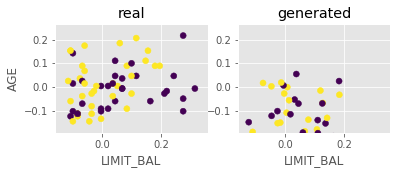

Step: 9900 of 50001.
Losses: G, D Gen, D Real: 0.6809, 0.6688, 0.6877
D Real - D Gen: 0.0189


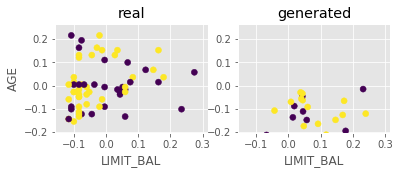

Step: 10000 of 50001.
Losses: G, D Gen, D Real: 0.7115, 0.6484, 0.6917
D Real - D Gen: 0.0433


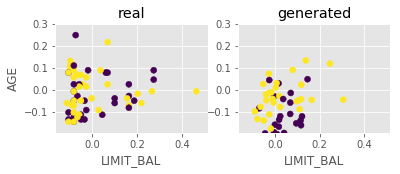

Step: 10100 of 50001.
Losses: G, D Gen, D Real: 0.6526, 0.6750, 0.6747
D Real - D Gen: -0.0003


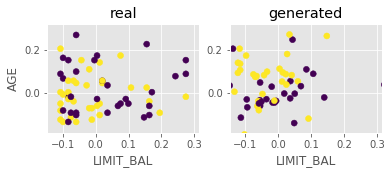

Step: 10200 of 50001.
Losses: G, D Gen, D Real: 0.6739, 0.7061, 0.6756
D Real - D Gen: -0.0306


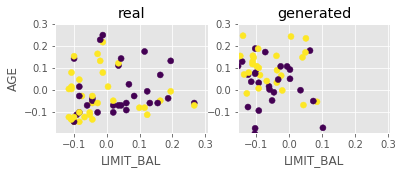

Step: 10300 of 50001.
Losses: G, D Gen, D Real: 0.6638, 0.6905, 0.6646
D Real - D Gen: -0.0259


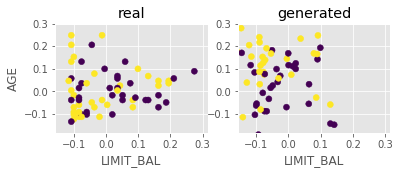

Step: 10400 of 50001.
Losses: G, D Gen, D Real: 0.6720, 0.6910, 0.6660
D Real - D Gen: -0.0250


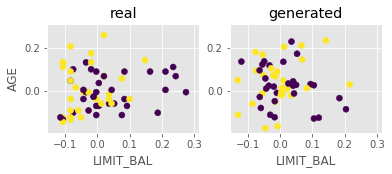

Step: 10500 of 50001.
Losses: G, D Gen, D Real: 0.6669, 0.6822, 0.6870
D Real - D Gen: 0.0048


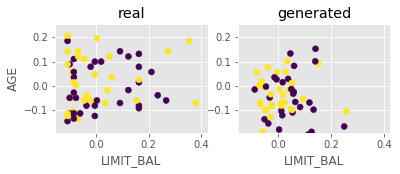

Step: 10600 of 50001.
Losses: G, D Gen, D Real: 0.7056, 0.6780, 0.6724
D Real - D Gen: -0.0055


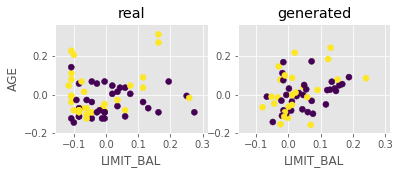

Step: 10700 of 50001.
Losses: G, D Gen, D Real: 0.6604, 0.6909, 0.6653
D Real - D Gen: -0.0256


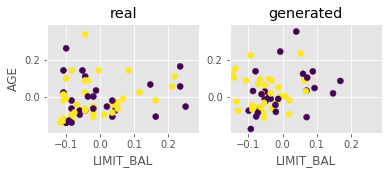

Step: 10800 of 50001.
Losses: G, D Gen, D Real: 0.6992, 0.6702, 0.6655
D Real - D Gen: -0.0047


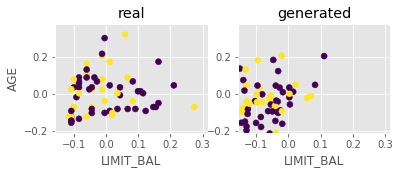

Step: 10900 of 50001.
Losses: G, D Gen, D Real: 0.6555, 0.6928, 0.6609
D Real - D Gen: -0.0318


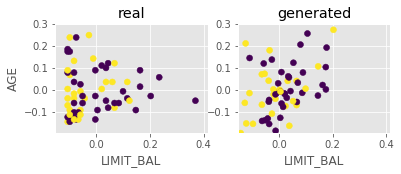

Step: 11000 of 50001.
Losses: G, D Gen, D Real: 0.6898, 0.6787, 0.6840
D Real - D Gen: 0.0054


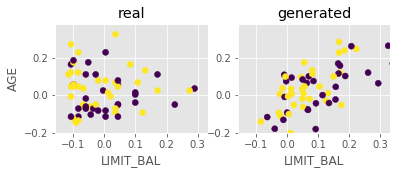

Step: 11100 of 50001.
Losses: G, D Gen, D Real: 0.6761, 0.6651, 0.6999
D Real - D Gen: 0.0348


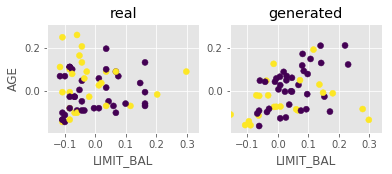

Step: 11200 of 50001.
Losses: G, D Gen, D Real: 0.7114, 0.6740, 0.6970
D Real - D Gen: 0.0230


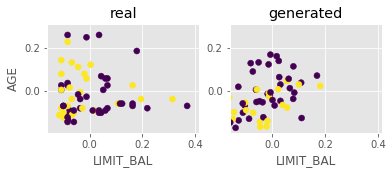

Step: 11300 of 50001.
Losses: G, D Gen, D Real: 0.6651, 0.6868, 0.6775
D Real - D Gen: -0.0093


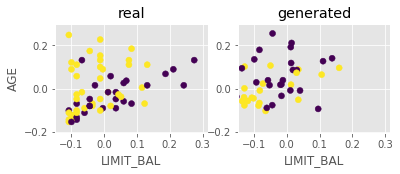

Step: 11400 of 50001.
Losses: G, D Gen, D Real: 0.6477, 0.6831, 0.6765
D Real - D Gen: -0.0066


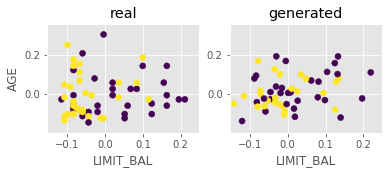

Step: 11500 of 50001.
Losses: G, D Gen, D Real: 0.6617, 0.6895, 0.6786
D Real - D Gen: -0.0110


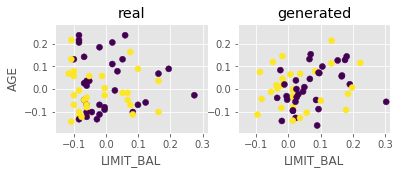

Step: 11600 of 50001.
Losses: G, D Gen, D Real: 0.6449, 0.6745, 0.6578
D Real - D Gen: -0.0167


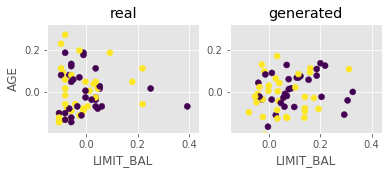

Step: 11700 of 50001.
Losses: G, D Gen, D Real: 0.6669, 0.7036, 0.6947
D Real - D Gen: -0.0089


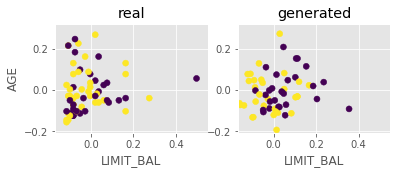

Step: 11800 of 50001.
Losses: G, D Gen, D Real: 0.6687, 0.6760, 0.6783
D Real - D Gen: 0.0023


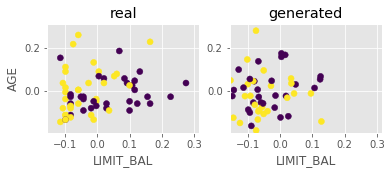

Step: 11900 of 50001.
Losses: G, D Gen, D Real: 0.6668, 0.6842, 0.6944
D Real - D Gen: 0.0102


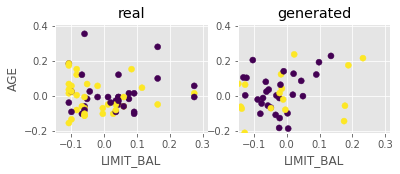

Step: 12000 of 50001.
Losses: G, D Gen, D Real: 0.6318, 0.6744, 0.6747
D Real - D Gen: 0.0003


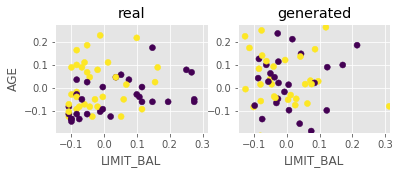

Step: 12100 of 50001.
Losses: G, D Gen, D Real: 0.6723, 0.6843, 0.6612
D Real - D Gen: -0.0231


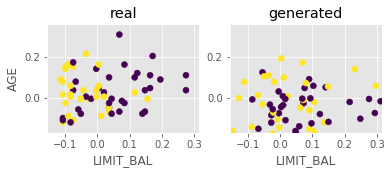

Step: 12200 of 50001.
Losses: G, D Gen, D Real: 0.6696, 0.6638, 0.6721
D Real - D Gen: 0.0083


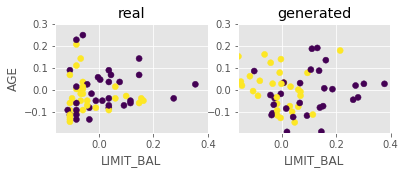

Step: 12300 of 50001.
Losses: G, D Gen, D Real: 0.7045, 0.6705, 0.6868
D Real - D Gen: 0.0163


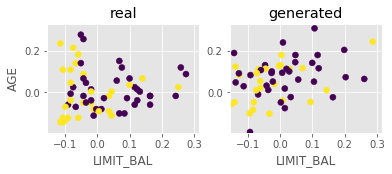

Step: 12400 of 50001.
Losses: G, D Gen, D Real: 0.6884, 0.6704, 0.6699
D Real - D Gen: -0.0005


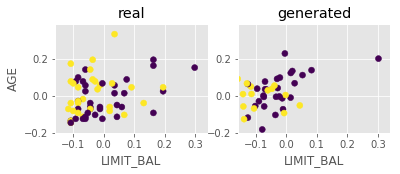

Step: 12500 of 50001.
Losses: G, D Gen, D Real: 0.7030, 0.6512, 0.6546
D Real - D Gen: 0.0034


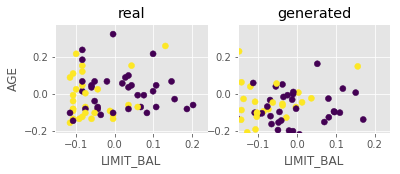

Step: 12600 of 50001.
Losses: G, D Gen, D Real: 0.6551, 0.6852, 0.6622
D Real - D Gen: -0.0230


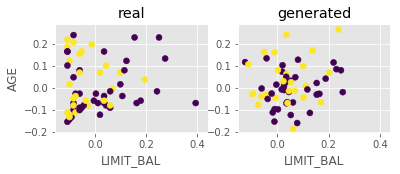

Step: 12700 of 50001.
Losses: G, D Gen, D Real: 0.6816, 0.6833, 0.6856
D Real - D Gen: 0.0023


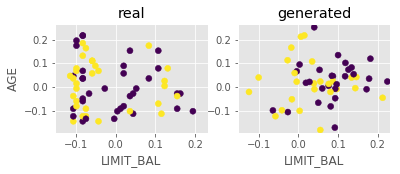

Step: 12800 of 50001.
Losses: G, D Gen, D Real: 0.6750, 0.6743, 0.6897
D Real - D Gen: 0.0154


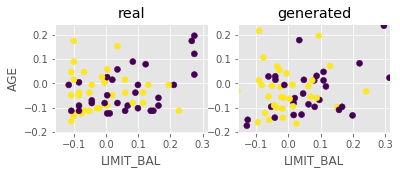

Step: 12900 of 50001.
Losses: G, D Gen, D Real: 0.6929, 0.6759, 0.6922
D Real - D Gen: 0.0162


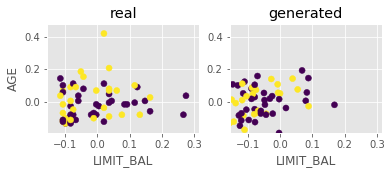

Step: 13000 of 50001.
Losses: G, D Gen, D Real: 0.6644, 0.6808, 0.6923
D Real - D Gen: 0.0115


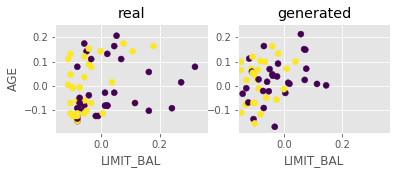

Step: 13100 of 50001.
Losses: G, D Gen, D Real: 0.6955, 0.6747, 0.6821
D Real - D Gen: 0.0074


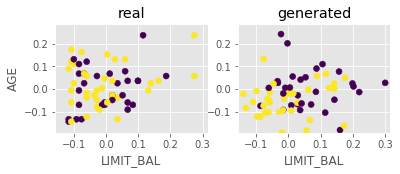

Step: 13200 of 50001.
Losses: G, D Gen, D Real: 0.6854, 0.6729, 0.6845
D Real - D Gen: 0.0116


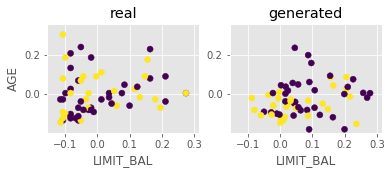

Step: 13300 of 50001.
Losses: G, D Gen, D Real: 0.7216, 0.6647, 0.6785
D Real - D Gen: 0.0138


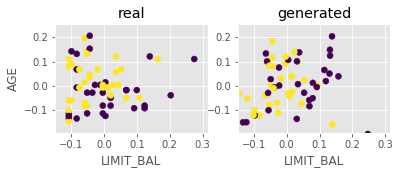

Step: 13400 of 50001.
Losses: G, D Gen, D Real: 0.6523, 0.6914, 0.6523
D Real - D Gen: -0.0391


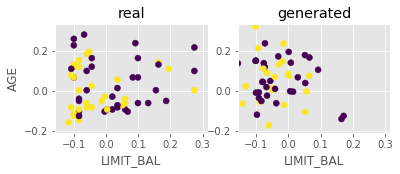

Step: 13500 of 50001.
Losses: G, D Gen, D Real: 0.6909, 0.6993, 0.6435
D Real - D Gen: -0.0558


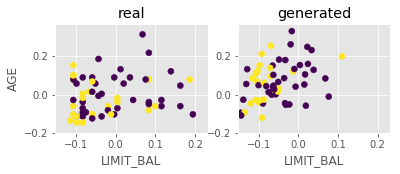

Step: 13600 of 50001.
Losses: G, D Gen, D Real: 0.6651, 0.7037, 0.6644
D Real - D Gen: -0.0393


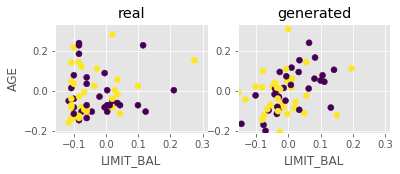

Step: 13700 of 50001.
Losses: G, D Gen, D Real: 0.6709, 0.6925, 0.6732
D Real - D Gen: -0.0193


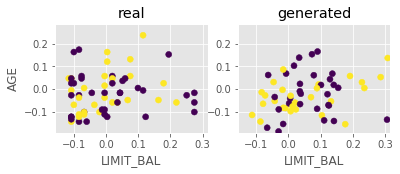

Step: 13800 of 50001.
Losses: G, D Gen, D Real: 0.6820, 0.6572, 0.6768
D Real - D Gen: 0.0196


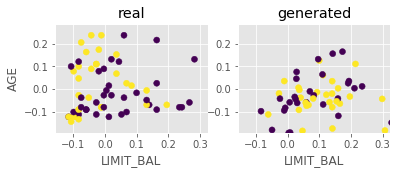

Step: 13900 of 50001.
Losses: G, D Gen, D Real: 0.7119, 0.6901, 0.6825
D Real - D Gen: -0.0076


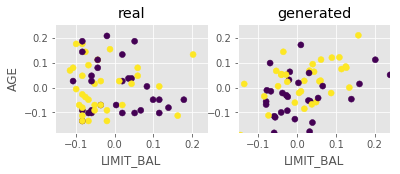

Step: 14000 of 50001.
Losses: G, D Gen, D Real: 0.6580, 0.6939, 0.6819
D Real - D Gen: -0.0120


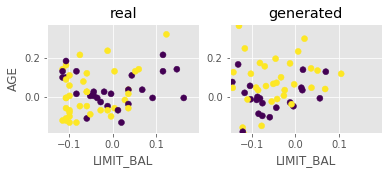

Step: 14100 of 50001.
Losses: G, D Gen, D Real: 0.6447, 0.6833, 0.6552
D Real - D Gen: -0.0281


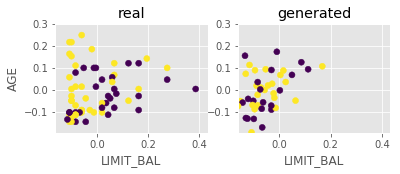

Step: 14200 of 50001.
Losses: G, D Gen, D Real: 0.6992, 0.6649, 0.6905
D Real - D Gen: 0.0256


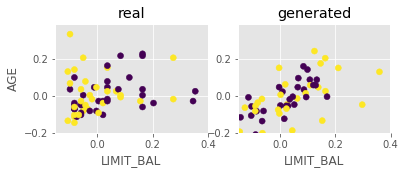

Step: 14300 of 50001.
Losses: G, D Gen, D Real: 0.6767, 0.6755, 0.6859
D Real - D Gen: 0.0104


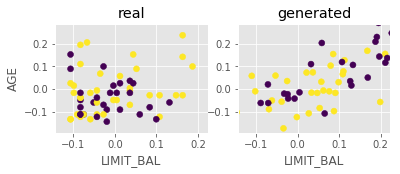

Step: 14400 of 50001.
Losses: G, D Gen, D Real: 0.6805, 0.6875, 0.6798
D Real - D Gen: -0.0077


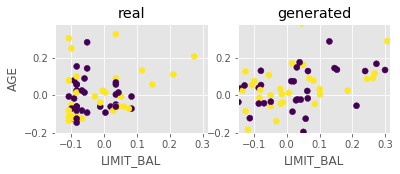

Step: 14500 of 50001.
Losses: G, D Gen, D Real: 0.6654, 0.6840, 0.6725
D Real - D Gen: -0.0115


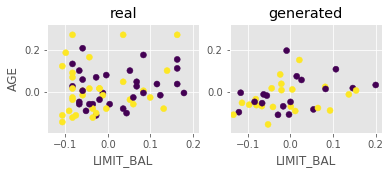

Step: 14600 of 50001.
Losses: G, D Gen, D Real: 0.6872, 0.6626, 0.6977
D Real - D Gen: 0.0351


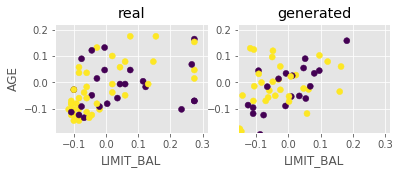

Step: 14700 of 50001.
Losses: G, D Gen, D Real: 0.6615, 0.6470, 0.6819
D Real - D Gen: 0.0350


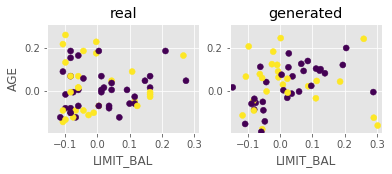

Step: 14800 of 50001.
Losses: G, D Gen, D Real: 0.6700, 0.6762, 0.6860
D Real - D Gen: 0.0098


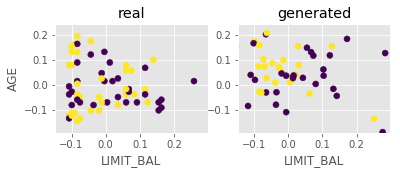

Step: 14900 of 50001.
Losses: G, D Gen, D Real: 0.6561, 0.6829, 0.6418
D Real - D Gen: -0.0411


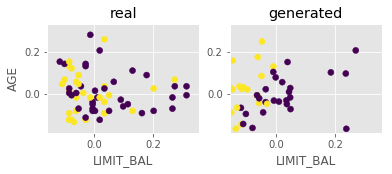

Step: 15000 of 50001.
Losses: G, D Gen, D Real: 0.7560, 0.6248, 0.5117
D Real - D Gen: -0.1131


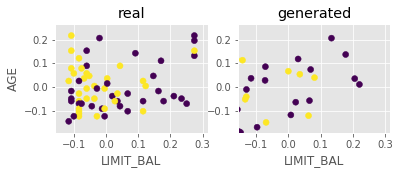

Step: 15100 of 50001.
Losses: G, D Gen, D Real: 0.6503, 0.6871, 0.5155
D Real - D Gen: -0.1716


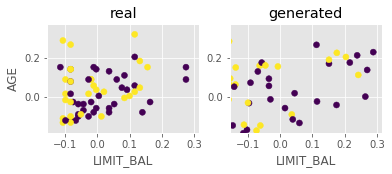

Step: 15200 of 50001.
Losses: G, D Gen, D Real: 0.6103, 0.7803, 0.5392
D Real - D Gen: -0.2411


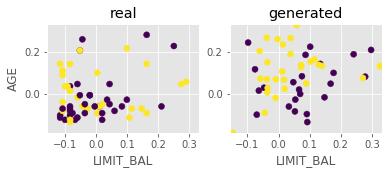

Step: 15300 of 50001.
Losses: G, D Gen, D Real: 0.5593, 0.7860, 0.6057
D Real - D Gen: -0.1803


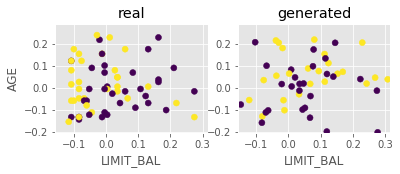

Step: 15400 of 50001.
Losses: G, D Gen, D Real: 0.6590, 0.7524, 0.6491
D Real - D Gen: -0.1033


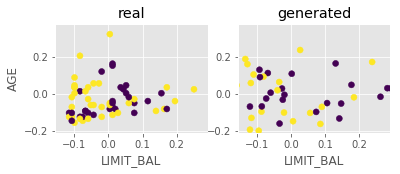

Step: 15500 of 50001.
Losses: G, D Gen, D Real: 0.7681, 0.6182, 0.6480
D Real - D Gen: 0.0298


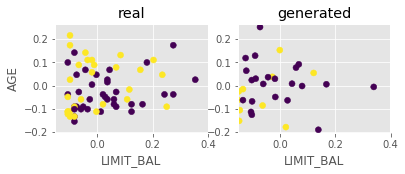

Step: 15600 of 50001.
Losses: G, D Gen, D Real: 0.7581, 0.6442, 0.6647
D Real - D Gen: 0.0205


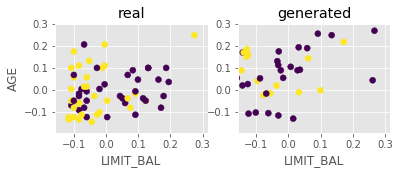

Step: 15700 of 50001.
Losses: G, D Gen, D Real: 0.6732, 0.6904, 0.6745
D Real - D Gen: -0.0159


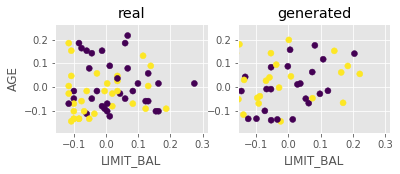

Step: 15800 of 50001.
Losses: G, D Gen, D Real: 0.6837, 0.6750, 0.6833
D Real - D Gen: 0.0082


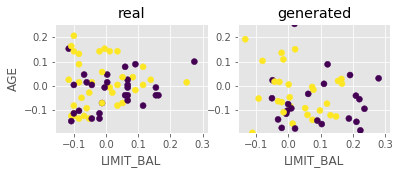

Step: 15900 of 50001.
Losses: G, D Gen, D Real: 0.6711, 0.6695, 0.6875
D Real - D Gen: 0.0181


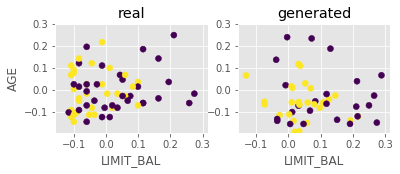

Step: 16000 of 50001.
Losses: G, D Gen, D Real: 0.6828, 0.6848, 0.6776
D Real - D Gen: -0.0072


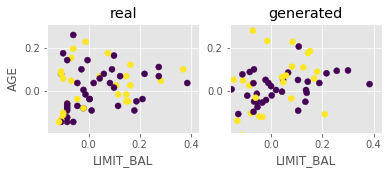

Step: 16100 of 50001.
Losses: G, D Gen, D Real: 0.6627, 0.6746, 0.6631
D Real - D Gen: -0.0115


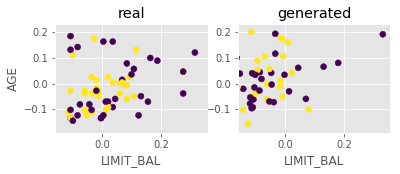

Step: 16200 of 50001.
Losses: G, D Gen, D Real: 0.6883, 0.6752, 0.6696
D Real - D Gen: -0.0057


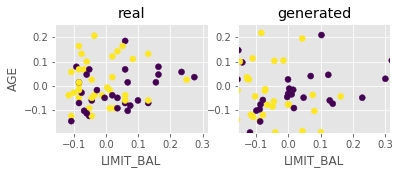

Step: 16300 of 50001.
Losses: G, D Gen, D Real: 0.6696, 0.6749, 0.6794
D Real - D Gen: 0.0045


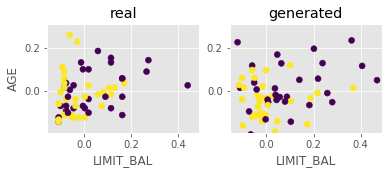

Step: 16400 of 50001.
Losses: G, D Gen, D Real: 0.7183, 0.6801, 0.6981
D Real - D Gen: 0.0179


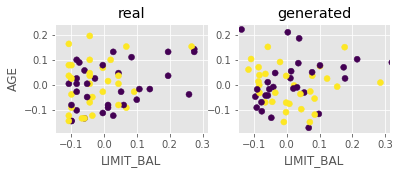

Step: 16500 of 50001.
Losses: G, D Gen, D Real: 0.6743, 0.6866, 0.6848
D Real - D Gen: -0.0018


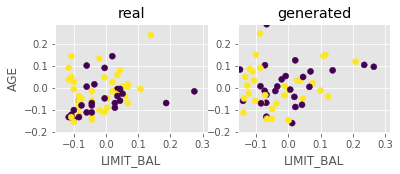

Step: 16600 of 50001.
Losses: G, D Gen, D Real: 0.7057, 0.6799, 0.7036
D Real - D Gen: 0.0237


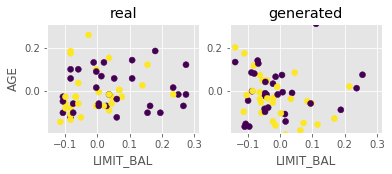

Step: 16700 of 50001.
Losses: G, D Gen, D Real: 0.6844, 0.6624, 0.6909
D Real - D Gen: 0.0285


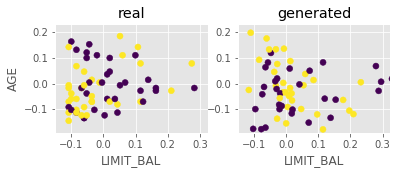

Step: 16800 of 50001.
Losses: G, D Gen, D Real: 0.7407, 0.6917, 0.6658
D Real - D Gen: -0.0260


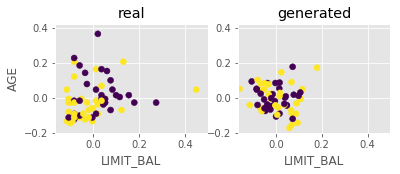

Step: 16900 of 50001.
Losses: G, D Gen, D Real: 0.6791, 0.6848, 0.6439
D Real - D Gen: -0.0408


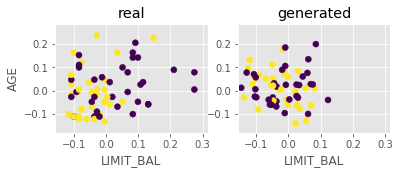

Step: 17000 of 50001.
Losses: G, D Gen, D Real: 0.6543, 0.6761, 0.7021
D Real - D Gen: 0.0259


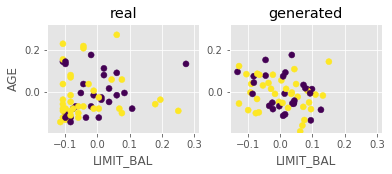

Step: 17100 of 50001.
Losses: G, D Gen, D Real: 0.6590, 0.6718, 0.6734
D Real - D Gen: 0.0016


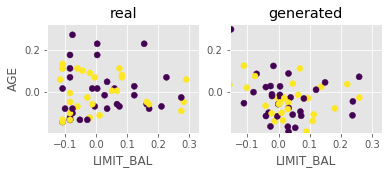

Step: 17200 of 50001.
Losses: G, D Gen, D Real: 0.6474, 0.6626, 0.6506
D Real - D Gen: -0.0120


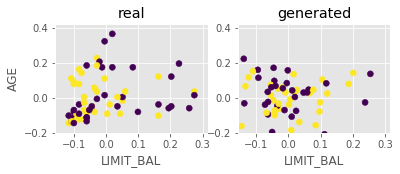

Step: 17300 of 50001.
Losses: G, D Gen, D Real: 0.7408, 0.6481, 0.6924
D Real - D Gen: 0.0442


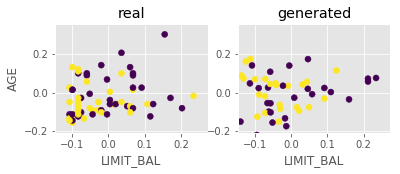

Step: 17400 of 50001.
Losses: G, D Gen, D Real: 0.7354, 0.6481, 0.6718
D Real - D Gen: 0.0238


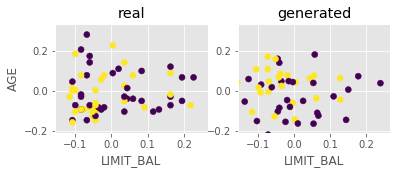

Step: 17500 of 50001.
Losses: G, D Gen, D Real: 0.7068, 0.6610, 0.6615
D Real - D Gen: 0.0005


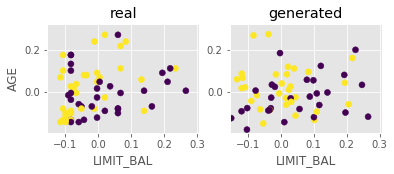

Step: 17600 of 50001.
Losses: G, D Gen, D Real: 0.6651, 0.6642, 0.6846
D Real - D Gen: 0.0204


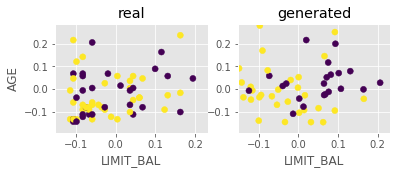

Step: 17700 of 50001.
Losses: G, D Gen, D Real: 0.6858, 0.6812, 0.6864
D Real - D Gen: 0.0052


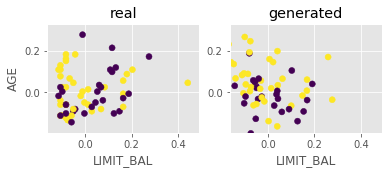

Step: 17800 of 50001.
Losses: G, D Gen, D Real: 0.6812, 0.6637, 0.6703
D Real - D Gen: 0.0066


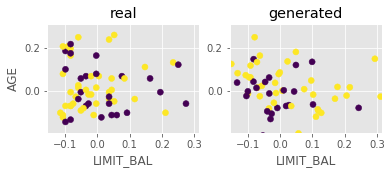

Step: 17900 of 50001.
Losses: G, D Gen, D Real: 0.6975, 0.6626, 0.6610
D Real - D Gen: -0.0017


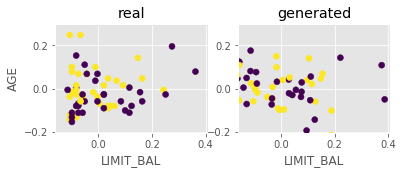

Step: 18000 of 50001.
Losses: G, D Gen, D Real: 0.6754, 0.6420, 0.6797
D Real - D Gen: 0.0377


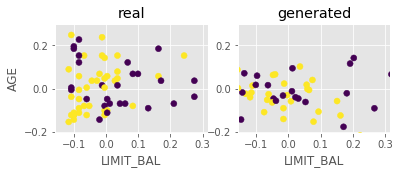

Step: 18100 of 50001.
Losses: G, D Gen, D Real: 0.6971, 0.6597, 0.6939
D Real - D Gen: 0.0342


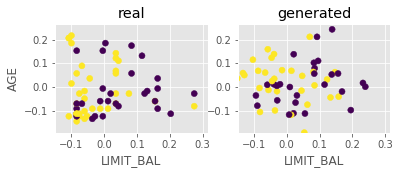

Step: 18200 of 50001.
Losses: G, D Gen, D Real: 0.6855, 0.6500, 0.6984
D Real - D Gen: 0.0484


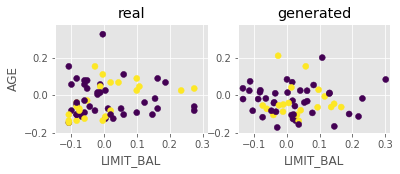

Step: 18300 of 50001.
Losses: G, D Gen, D Real: 0.6982, 0.6671, 0.6729
D Real - D Gen: 0.0058


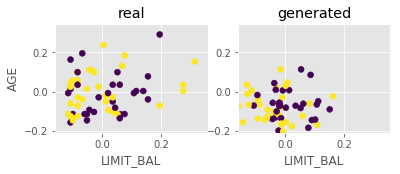

Step: 18400 of 50001.
Losses: G, D Gen, D Real: 0.6500, 0.6870, 0.6530
D Real - D Gen: -0.0340


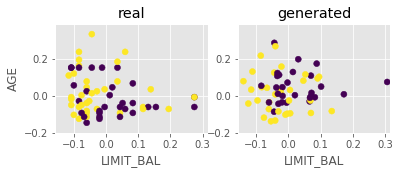

Step: 18500 of 50001.
Losses: G, D Gen, D Real: 0.6911, 0.6855, 0.6464
D Real - D Gen: -0.0391


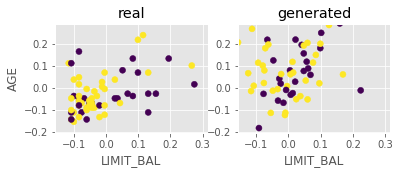

Step: 18600 of 50001.
Losses: G, D Gen, D Real: 0.6660, 0.6768, 0.6979
D Real - D Gen: 0.0211


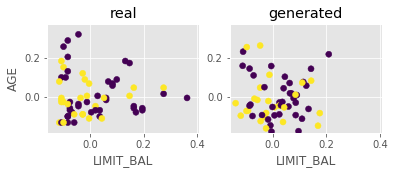

Step: 18700 of 50001.
Losses: G, D Gen, D Real: 0.7064, 0.6646, 0.6898
D Real - D Gen: 0.0253


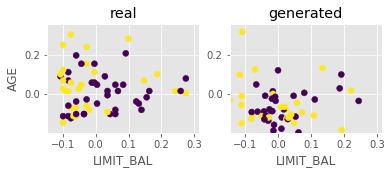

Step: 18800 of 50001.
Losses: G, D Gen, D Real: 0.6611, 0.6538, 0.6628
D Real - D Gen: 0.0089


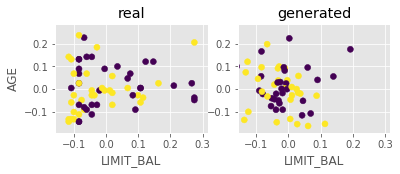

Step: 18900 of 50001.
Losses: G, D Gen, D Real: 0.7013, 0.6656, 0.6723
D Real - D Gen: 0.0067


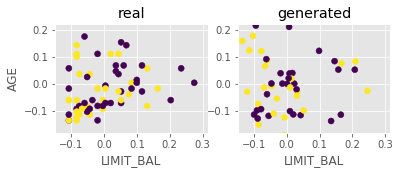

Step: 19000 of 50001.
Losses: G, D Gen, D Real: 0.6722, 0.6591, 0.6888
D Real - D Gen: 0.0297


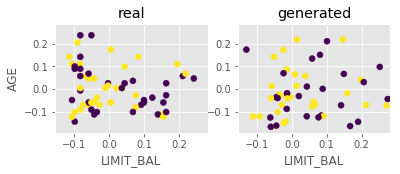

Step: 19100 of 50001.
Losses: G, D Gen, D Real: 0.7374, 0.6767, 0.6709
D Real - D Gen: -0.0058


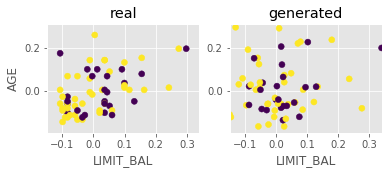

Step: 19200 of 50001.
Losses: G, D Gen, D Real: 0.6796, 0.6468, 0.6979
D Real - D Gen: 0.0510


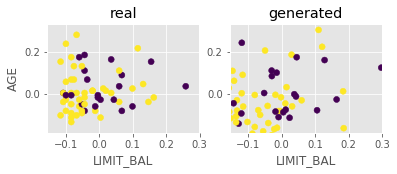

Step: 19300 of 50001.
Losses: G, D Gen, D Real: 0.7170, 0.6750, 0.6880
D Real - D Gen: 0.0130


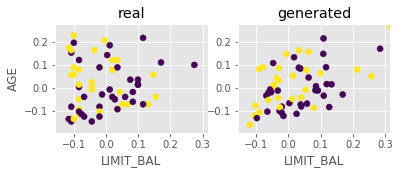

Step: 19400 of 50001.
Losses: G, D Gen, D Real: 0.6584, 0.6717, 0.6504
D Real - D Gen: -0.0214


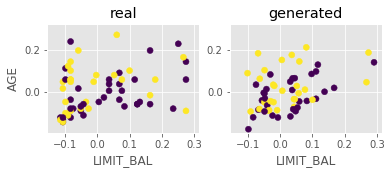

Step: 19500 of 50001.
Losses: G, D Gen, D Real: 0.6970, 0.6983, 0.6632
D Real - D Gen: -0.0351


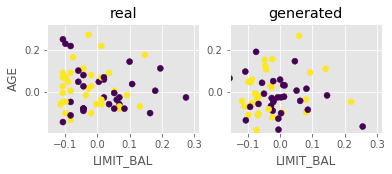

Step: 19600 of 50001.
Losses: G, D Gen, D Real: 0.6619, 0.6994, 0.6702
D Real - D Gen: -0.0292


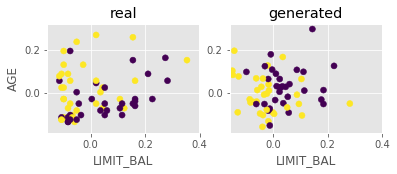

Step: 19700 of 50001.
Losses: G, D Gen, D Real: 0.6422, 0.6631, 0.6798
D Real - D Gen: 0.0167


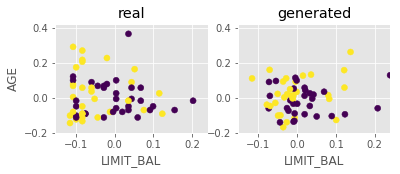

Step: 19800 of 50001.
Losses: G, D Gen, D Real: 0.6504, 0.6645, 0.6604
D Real - D Gen: -0.0041


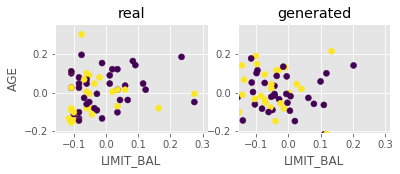

Step: 19900 of 50001.
Losses: G, D Gen, D Real: 0.6430, 0.6652, 0.6720
D Real - D Gen: 0.0068


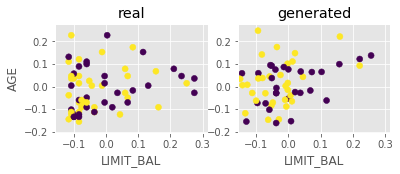

Step: 20000 of 50001.
Losses: G, D Gen, D Real: 0.6796, 0.6878, 0.6809
D Real - D Gen: -0.0069


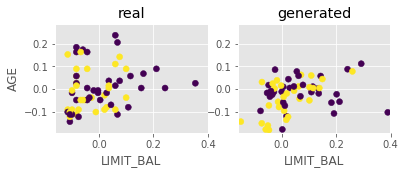

Step: 20100 of 50001.
Losses: G, D Gen, D Real: 0.6470, 0.6926, 0.6707
D Real - D Gen: -0.0219


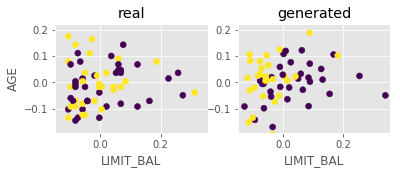

Step: 20200 of 50001.
Losses: G, D Gen, D Real: 0.6715, 0.6848, 0.6467
D Real - D Gen: -0.0380


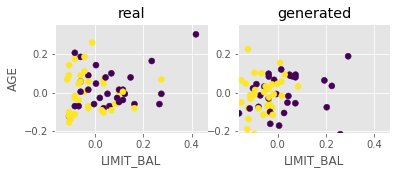

Step: 20300 of 50001.
Losses: G, D Gen, D Real: 0.6360, 0.6724, 0.6731
D Real - D Gen: 0.0007


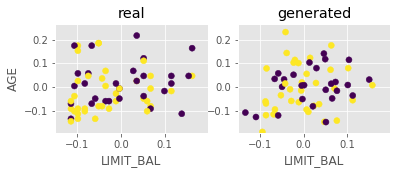

Step: 20400 of 50001.
Losses: G, D Gen, D Real: 0.7091, 0.6553, 0.6749
D Real - D Gen: 0.0196


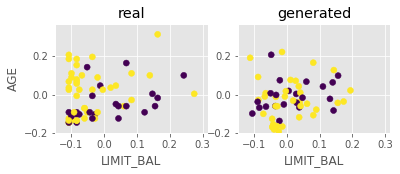

Step: 20500 of 50001.
Losses: G, D Gen, D Real: 0.6842, 0.6693, 0.6347
D Real - D Gen: -0.0346


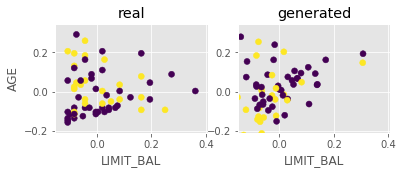

Step: 20600 of 50001.
Losses: G, D Gen, D Real: 0.6674, 0.6575, 0.6574
D Real - D Gen: -0.0001


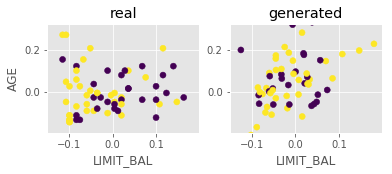

Step: 20700 of 50001.
Losses: G, D Gen, D Real: 0.6482, 0.6589, 0.6501
D Real - D Gen: -0.0088


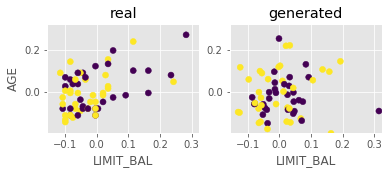

Step: 20800 of 50001.
Losses: G, D Gen, D Real: 0.6747, 0.6912, 0.6650
D Real - D Gen: -0.0262


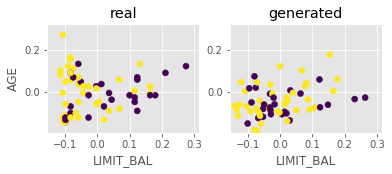

Step: 20900 of 50001.
Losses: G, D Gen, D Real: 0.6599, 0.6557, 0.6930
D Real - D Gen: 0.0373


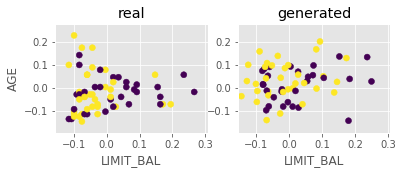

Step: 21000 of 50001.
Losses: G, D Gen, D Real: 0.6875, 0.6716, 0.6697
D Real - D Gen: -0.0019


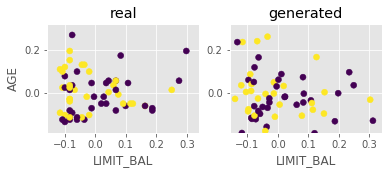

Step: 21100 of 50001.
Losses: G, D Gen, D Real: 0.6768, 0.6470, 0.6747
D Real - D Gen: 0.0277


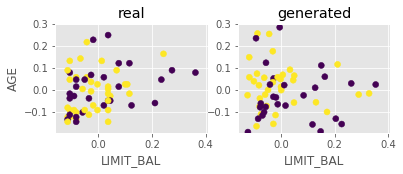

Step: 21200 of 50001.
Losses: G, D Gen, D Real: 0.6873, 0.6694, 0.6658
D Real - D Gen: -0.0036


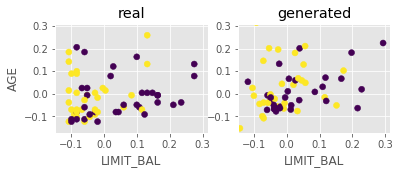

Step: 21300 of 50001.
Losses: G, D Gen, D Real: 0.6491, 0.6454, 0.6456
D Real - D Gen: 0.0001


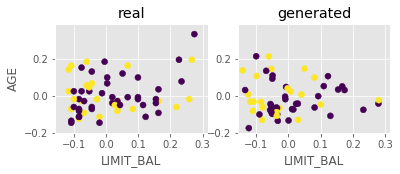

Step: 21400 of 50001.
Losses: G, D Gen, D Real: 0.6781, 0.6978, 0.6812
D Real - D Gen: -0.0166


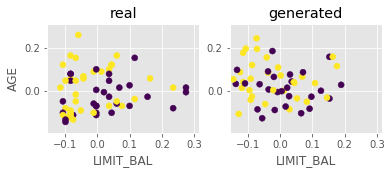

Step: 21500 of 50001.
Losses: G, D Gen, D Real: 0.6711, 0.6627, 0.6841
D Real - D Gen: 0.0214


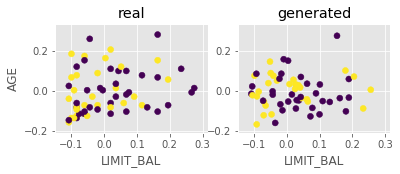

Step: 21600 of 50001.
Losses: G, D Gen, D Real: 0.6937, 0.6795, 0.6884
D Real - D Gen: 0.0089


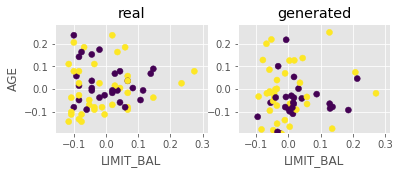

Step: 21700 of 50001.
Losses: G, D Gen, D Real: 0.6487, 0.6714, 0.6824
D Real - D Gen: 0.0110


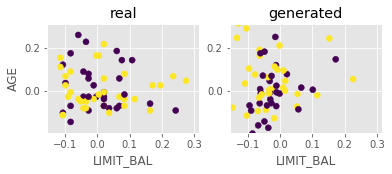

Step: 21800 of 50001.
Losses: G, D Gen, D Real: 0.6900, 0.6917, 0.6676
D Real - D Gen: -0.0241


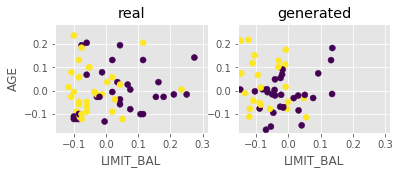

Step: 21900 of 50001.
Losses: G, D Gen, D Real: 0.6661, 0.6799, 0.6694
D Real - D Gen: -0.0105


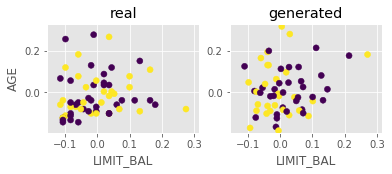

Step: 22000 of 50001.
Losses: G, D Gen, D Real: 0.7028, 0.6647, 0.6825
D Real - D Gen: 0.0178


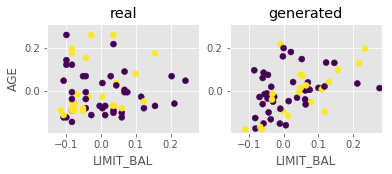

Step: 22100 of 50001.
Losses: G, D Gen, D Real: 0.6726, 0.6637, 0.6774
D Real - D Gen: 0.0137


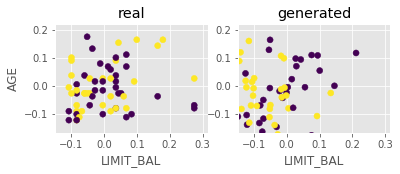

Step: 22200 of 50001.
Losses: G, D Gen, D Real: 0.7233, 0.6561, 0.6812
D Real - D Gen: 0.0251


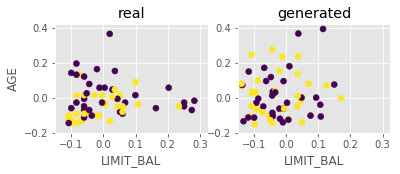

Step: 22300 of 50001.
Losses: G, D Gen, D Real: 0.6611, 0.6625, 0.6578
D Real - D Gen: -0.0047


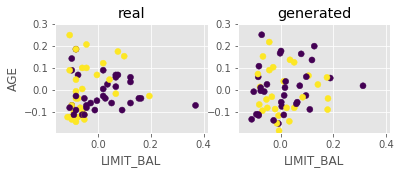

Step: 22400 of 50001.
Losses: G, D Gen, D Real: 0.7154, 0.7089, 0.6581
D Real - D Gen: -0.0508


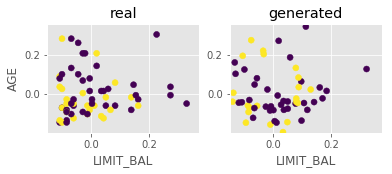

Step: 22500 of 50001.
Losses: G, D Gen, D Real: 0.7122, 0.6322, 0.6888
D Real - D Gen: 0.0566


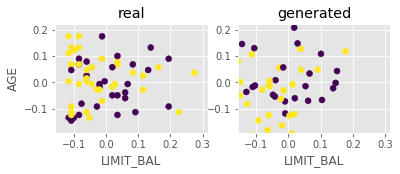

Step: 22600 of 50001.
Losses: G, D Gen, D Real: 0.6585, 0.6526, 0.6968
D Real - D Gen: 0.0442


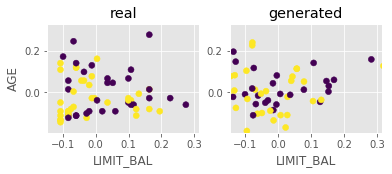

Step: 22700 of 50001.
Losses: G, D Gen, D Real: 0.6586, 0.6760, 0.6388
D Real - D Gen: -0.0372


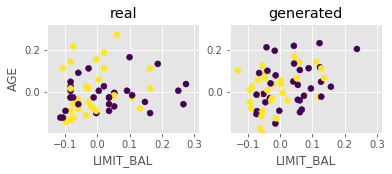

Step: 22800 of 50001.
Losses: G, D Gen, D Real: 0.6666, 0.6501, 0.6358
D Real - D Gen: -0.0143


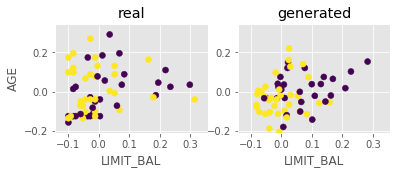

Step: 22900 of 50001.
Losses: G, D Gen, D Real: 0.6339, 0.6685, 0.6811
D Real - D Gen: 0.0126


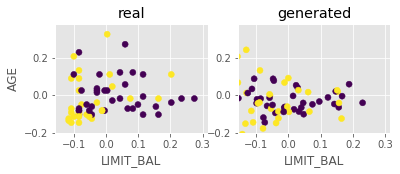

Step: 23000 of 50001.
Losses: G, D Gen, D Real: 0.5962, 0.6580, 0.6800
D Real - D Gen: 0.0221


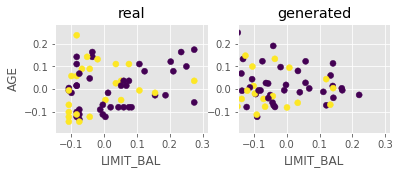

Step: 23100 of 50001.
Losses: G, D Gen, D Real: 0.6766, 0.6647, 0.6990
D Real - D Gen: 0.0343


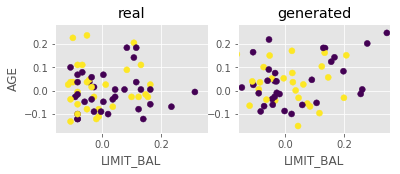

Step: 23200 of 50001.
Losses: G, D Gen, D Real: 0.6590, 0.6553, 0.6444
D Real - D Gen: -0.0110


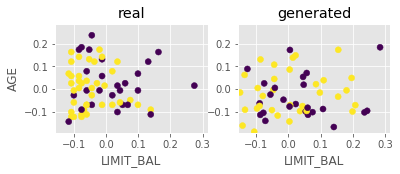

Step: 23300 of 50001.
Losses: G, D Gen, D Real: 0.7023, 0.6659, 0.6911
D Real - D Gen: 0.0252


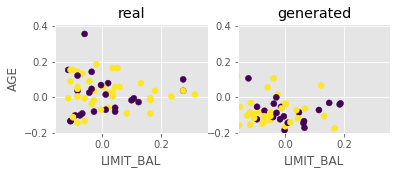

Step: 23400 of 50001.
Losses: G, D Gen, D Real: 0.6693, 0.6540, 0.6655
D Real - D Gen: 0.0115


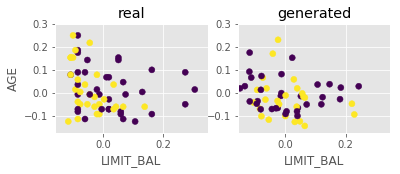

Step: 23500 of 50001.
Losses: G, D Gen, D Real: 0.7041, 0.6891, 0.6567
D Real - D Gen: -0.0324


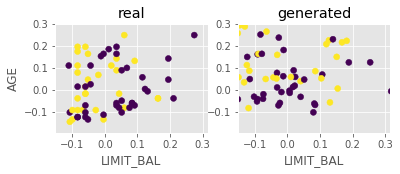

Step: 23600 of 50001.
Losses: G, D Gen, D Real: 0.6885, 0.6586, 0.6569
D Real - D Gen: -0.0017


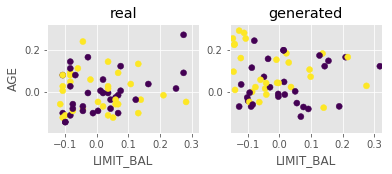

Step: 23700 of 50001.
Losses: G, D Gen, D Real: 0.6678, 0.6688, 0.6473
D Real - D Gen: -0.0215


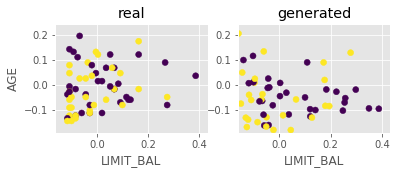

Step: 23800 of 50001.
Losses: G, D Gen, D Real: 0.6511, 0.6706, 0.6476
D Real - D Gen: -0.0230


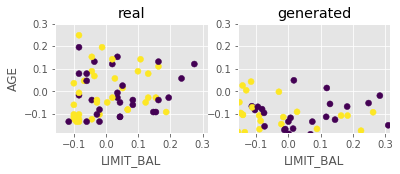

Step: 23900 of 50001.
Losses: G, D Gen, D Real: 0.7085, 0.6618, 0.6844
D Real - D Gen: 0.0226


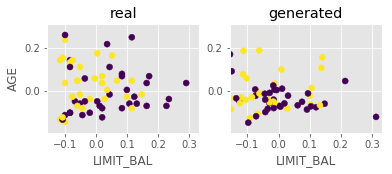

Step: 24000 of 50001.
Losses: G, D Gen, D Real: 0.6379, 0.6861, 0.6725
D Real - D Gen: -0.0136


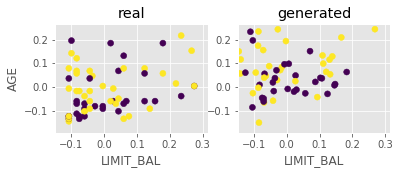

Step: 24100 of 50001.
Losses: G, D Gen, D Real: 0.6617, 0.6870, 0.6727
D Real - D Gen: -0.0143


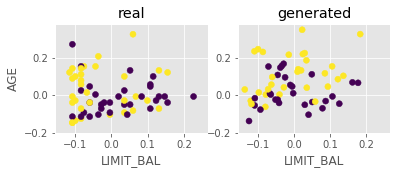

Step: 24200 of 50001.
Losses: G, D Gen, D Real: 0.6486, 0.6705, 0.7104
D Real - D Gen: 0.0399


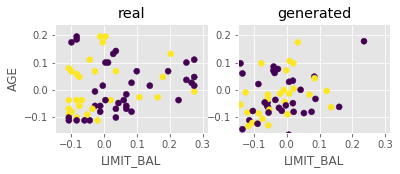

Step: 24300 of 50001.
Losses: G, D Gen, D Real: 0.7025, 0.6500, 0.6475
D Real - D Gen: -0.0025


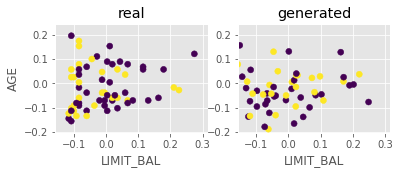

Step: 24400 of 50001.
Losses: G, D Gen, D Real: 0.6730, 0.6501, 0.6801
D Real - D Gen: 0.0300


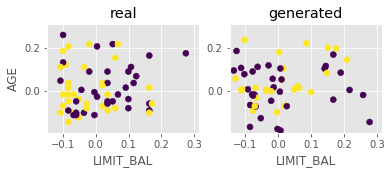

Step: 24500 of 50001.
Losses: G, D Gen, D Real: 0.6592, 0.7034, 0.6505
D Real - D Gen: -0.0529


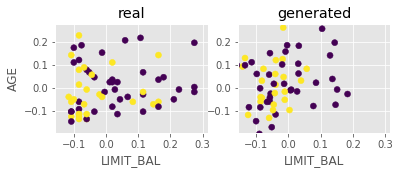

Step: 24600 of 50001.
Losses: G, D Gen, D Real: 0.6339, 0.6950, 0.6538
D Real - D Gen: -0.0412


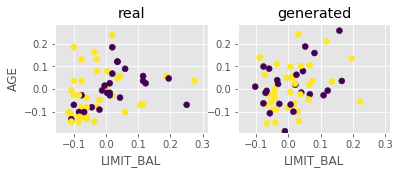

Step: 24700 of 50001.
Losses: G, D Gen, D Real: 0.6936, 0.6699, 0.6823
D Real - D Gen: 0.0124


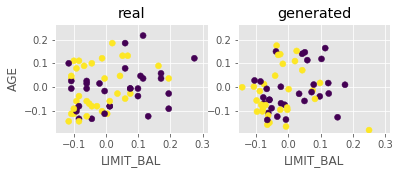

Step: 24800 of 50001.
Losses: G, D Gen, D Real: 0.6570, 0.6573, 0.6750
D Real - D Gen: 0.0177


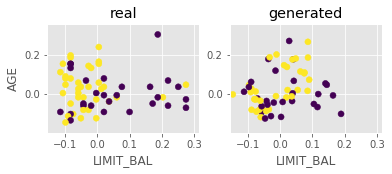

Step: 24900 of 50001.
Losses: G, D Gen, D Real: 0.7312, 0.6636, 0.6731
D Real - D Gen: 0.0095


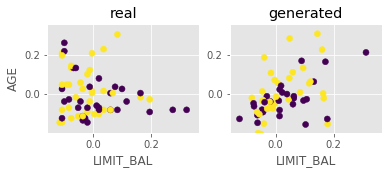

Step: 25000 of 50001.
Losses: G, D Gen, D Real: 0.6903, 0.6393, 0.6459
D Real - D Gen: 0.0067


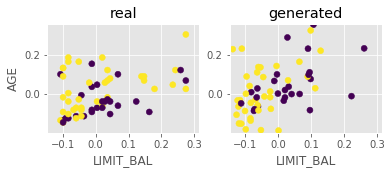

Step: 25100 of 50001.
Losses: G, D Gen, D Real: 0.7829, 0.6740, 0.6579
D Real - D Gen: -0.0161


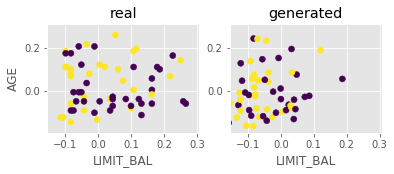

Step: 25200 of 50001.
Losses: G, D Gen, D Real: 0.7026, 0.6750, 0.6858
D Real - D Gen: 0.0108


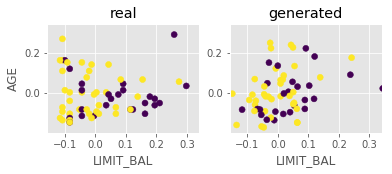

Step: 25300 of 50001.
Losses: G, D Gen, D Real: 0.7781, 0.6445, 0.6960
D Real - D Gen: 0.0514


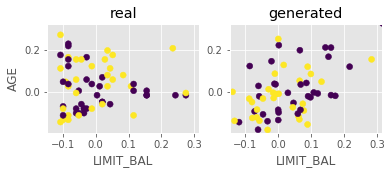

Step: 25400 of 50001.
Losses: G, D Gen, D Real: 0.6929, 0.6587, 0.6592
D Real - D Gen: 0.0006


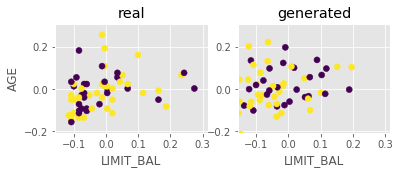

Step: 25500 of 50001.
Losses: G, D Gen, D Real: 0.6573, 0.6738, 0.6623
D Real - D Gen: -0.0116


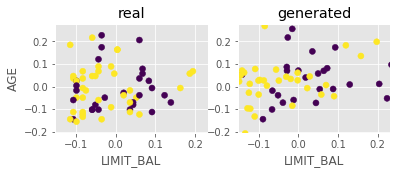

Step: 25600 of 50001.
Losses: G, D Gen, D Real: 0.6784, 0.6650, 0.6518
D Real - D Gen: -0.0132


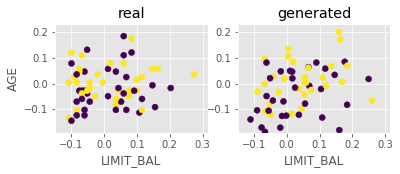

Step: 25700 of 50001.
Losses: G, D Gen, D Real: 0.6452, 0.6661, 0.6841
D Real - D Gen: 0.0180


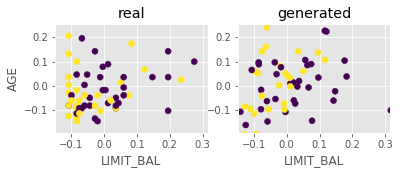

Step: 25800 of 50001.
Losses: G, D Gen, D Real: 0.6676, 0.6758, 0.7092
D Real - D Gen: 0.0334


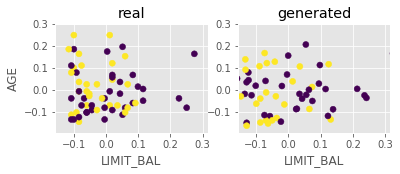

Step: 25900 of 50001.
Losses: G, D Gen, D Real: 0.6366, 0.6749, 0.6356
D Real - D Gen: -0.0394


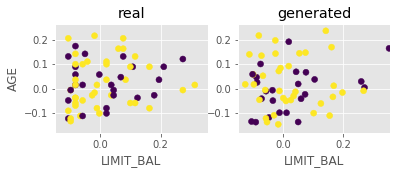

Step: 26000 of 50001.
Losses: G, D Gen, D Real: 0.6815, 0.6670, 0.6716
D Real - D Gen: 0.0046


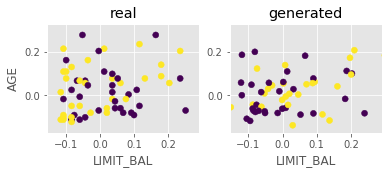

Step: 26100 of 50001.
Losses: G, D Gen, D Real: 0.6345, 0.6586, 0.6987
D Real - D Gen: 0.0402


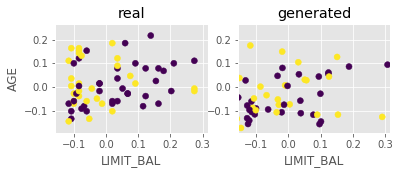

Step: 26200 of 50001.
Losses: G, D Gen, D Real: 0.6640, 0.6686, 0.6555
D Real - D Gen: -0.0131


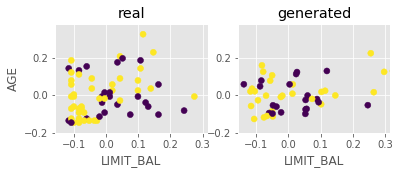

Step: 26300 of 50001.
Losses: G, D Gen, D Real: 0.6238, 0.6764, 0.6700
D Real - D Gen: -0.0064


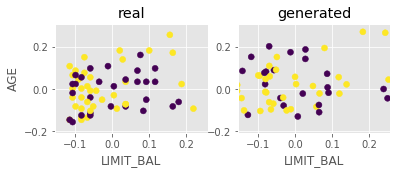

Step: 26400 of 50001.
Losses: G, D Gen, D Real: 0.7153, 0.6650, 0.6803
D Real - D Gen: 0.0152


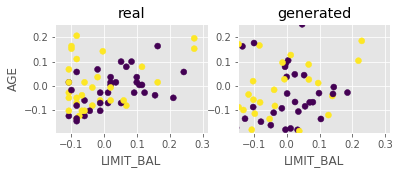

Step: 26500 of 50001.
Losses: G, D Gen, D Real: 0.6888, 0.6494, 0.6644
D Real - D Gen: 0.0150


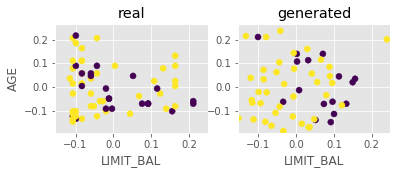

Step: 26600 of 50001.
Losses: G, D Gen, D Real: 0.6601, 0.6666, 0.6827
D Real - D Gen: 0.0161


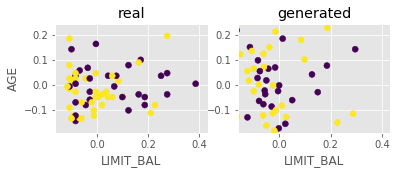

Step: 26700 of 50001.
Losses: G, D Gen, D Real: 0.6678, 0.6458, 0.6902
D Real - D Gen: 0.0444


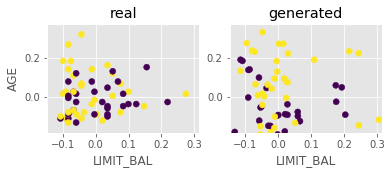

Step: 26800 of 50001.
Losses: G, D Gen, D Real: 0.6880, 0.6641, 0.6817
D Real - D Gen: 0.0177


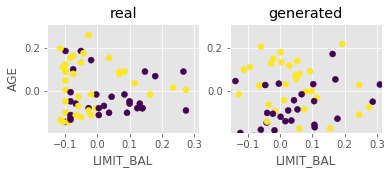

Step: 26900 of 50001.
Losses: G, D Gen, D Real: 0.6470, 0.6432, 0.6571
D Real - D Gen: 0.0140


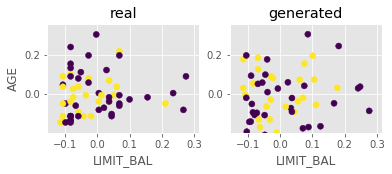

Step: 27000 of 50001.
Losses: G, D Gen, D Real: 0.7017, 0.6700, 0.6598
D Real - D Gen: -0.0102


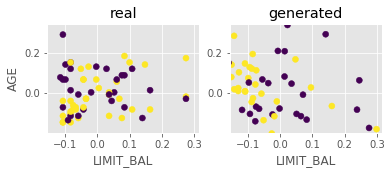

Step: 27100 of 50001.
Losses: G, D Gen, D Real: 0.6692, 0.6580, 0.6869
D Real - D Gen: 0.0288


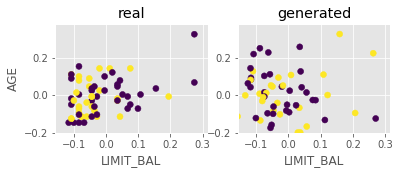

Step: 27200 of 50001.
Losses: G, D Gen, D Real: 0.7377, 0.6417, 0.6455
D Real - D Gen: 0.0038


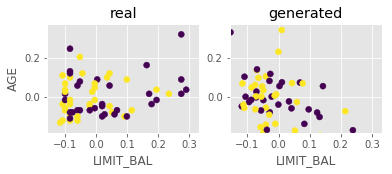

Step: 27300 of 50001.
Losses: G, D Gen, D Real: 0.6748, 0.6381, 0.6535
D Real - D Gen: 0.0154


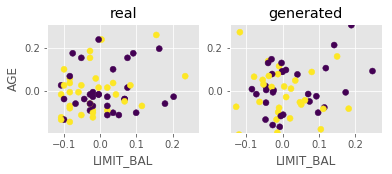

Step: 27400 of 50001.
Losses: G, D Gen, D Real: 0.7175, 0.6882, 0.7162
D Real - D Gen: 0.0280


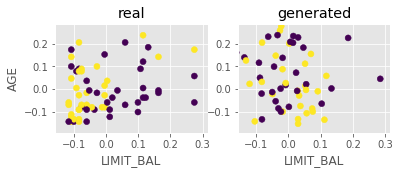

Step: 27500 of 50001.
Losses: G, D Gen, D Real: 0.6599, 0.6703, 0.6732
D Real - D Gen: 0.0029


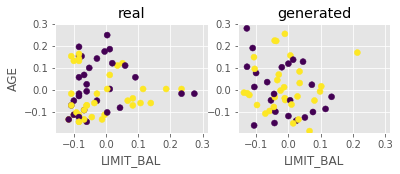

Step: 27600 of 50001.
Losses: G, D Gen, D Real: 0.6909, 0.6834, 0.6633
D Real - D Gen: -0.0201


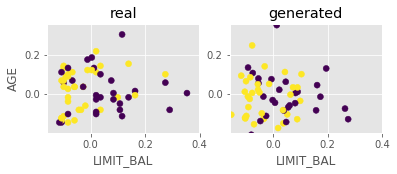

Step: 27700 of 50001.
Losses: G, D Gen, D Real: 0.6665, 0.6708, 0.6415
D Real - D Gen: -0.0293


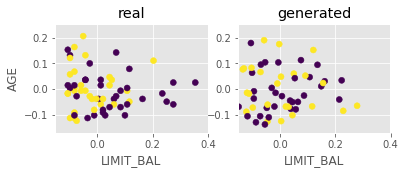

Step: 27800 of 50001.
Losses: G, D Gen, D Real: 0.7391, 0.6863, 0.6735
D Real - D Gen: -0.0128


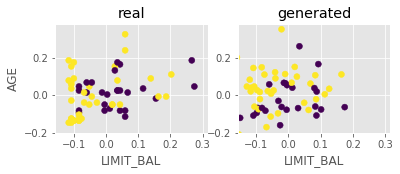

Step: 27900 of 50001.
Losses: G, D Gen, D Real: 0.6798, 0.6448, 0.6684
D Real - D Gen: 0.0236


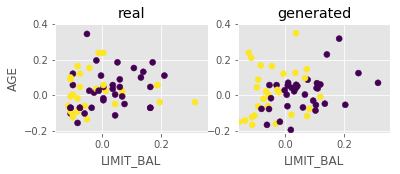

Step: 28000 of 50001.
Losses: G, D Gen, D Real: 0.7487, 0.6713, 0.6704
D Real - D Gen: -0.0010


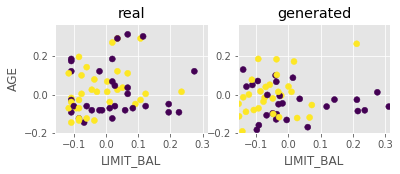

Step: 28100 of 50001.
Losses: G, D Gen, D Real: 0.6562, 0.6414, 0.6779
D Real - D Gen: 0.0365


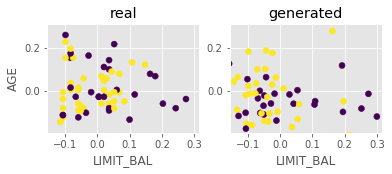

Step: 28200 of 50001.
Losses: G, D Gen, D Real: 0.6035, 0.6509, 0.6623
D Real - D Gen: 0.0113


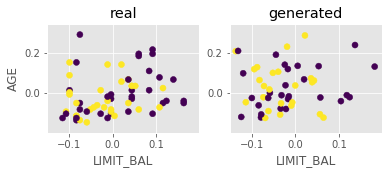

Step: 28300 of 50001.
Losses: G, D Gen, D Real: 0.6663, 0.6588, 0.6915
D Real - D Gen: 0.0327


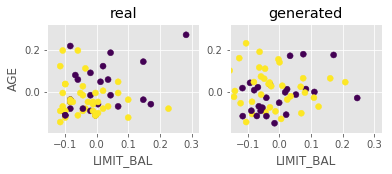

Step: 28400 of 50001.
Losses: G, D Gen, D Real: 0.6126, 0.6551, 0.6854
D Real - D Gen: 0.0303


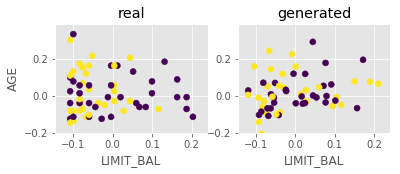

Step: 28500 of 50001.
Losses: G, D Gen, D Real: 0.6703, 0.6520, 0.6560
D Real - D Gen: 0.0040


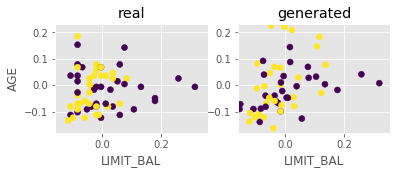

Step: 28600 of 50001.
Losses: G, D Gen, D Real: 0.6358, 0.6559, 0.6654
D Real - D Gen: 0.0095


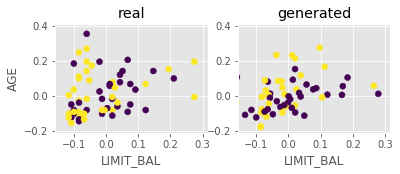

Step: 28700 of 50001.
Losses: G, D Gen, D Real: 0.6911, 0.6595, 0.6476
D Real - D Gen: -0.0118


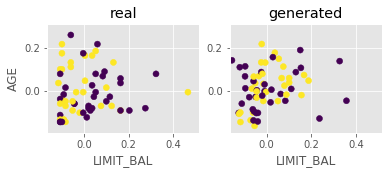

Step: 28800 of 50001.
Losses: G, D Gen, D Real: 0.6423, 0.6630, 0.6506
D Real - D Gen: -0.0124


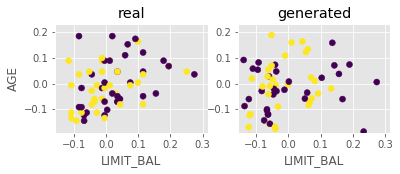

Step: 28900 of 50001.
Losses: G, D Gen, D Real: 0.6691, 0.6554, 0.6567
D Real - D Gen: 0.0013


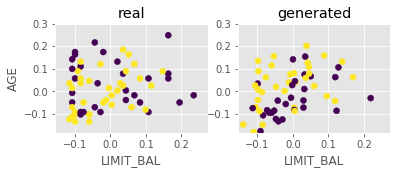

Step: 29000 of 50001.
Losses: G, D Gen, D Real: 0.6079, 0.6693, 0.6376
D Real - D Gen: -0.0317


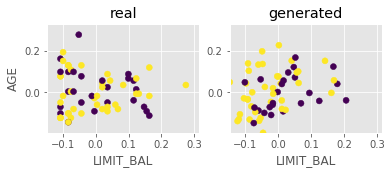

Step: 29100 of 50001.
Losses: G, D Gen, D Real: 0.6787, 0.6900, 0.6543
D Real - D Gen: -0.0358


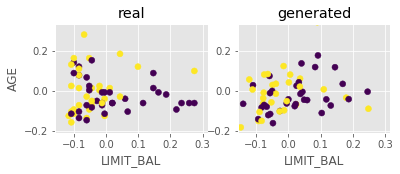

Step: 29200 of 50001.
Losses: G, D Gen, D Real: 0.6315, 0.6549, 0.6853
D Real - D Gen: 0.0303


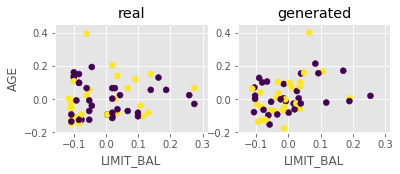

Step: 29300 of 50001.
Losses: G, D Gen, D Real: 0.6667, 0.6768, 0.6500
D Real - D Gen: -0.0269


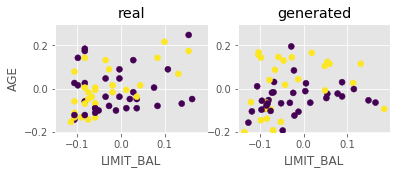

Step: 29400 of 50001.
Losses: G, D Gen, D Real: 0.6208, 0.6569, 0.6419
D Real - D Gen: -0.0150


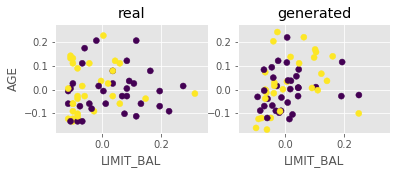

Step: 29500 of 50001.
Losses: G, D Gen, D Real: 0.6837, 0.6638, 0.6763
D Real - D Gen: 0.0125


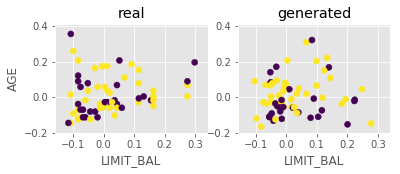

Step: 29600 of 50001.
Losses: G, D Gen, D Real: 0.6310, 0.6540, 0.6550
D Real - D Gen: 0.0010


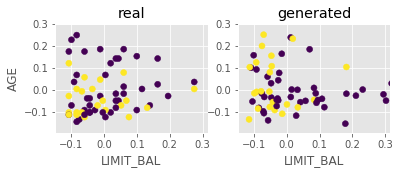

Step: 29700 of 50001.
Losses: G, D Gen, D Real: 0.6802, 0.6651, 0.6830
D Real - D Gen: 0.0179


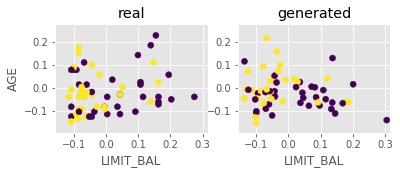

Step: 29800 of 50001.
Losses: G, D Gen, D Real: 0.6164, 0.6614, 0.6568
D Real - D Gen: -0.0046


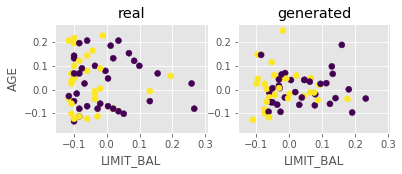

Step: 29900 of 50001.
Losses: G, D Gen, D Real: 0.6805, 0.6657, 0.6898
D Real - D Gen: 0.0242


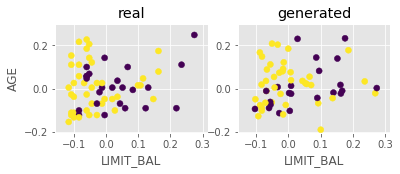

Step: 30000 of 50001.
Losses: G, D Gen, D Real: 0.6378, 0.6491, 0.6727
D Real - D Gen: 0.0236


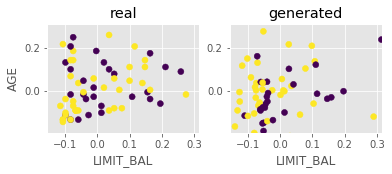

Step: 30100 of 50001.
Losses: G, D Gen, D Real: 0.7638, 0.6792, 0.6907
D Real - D Gen: 0.0114


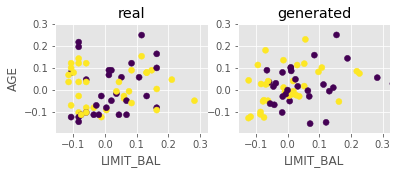

Step: 30200 of 50001.
Losses: G, D Gen, D Real: 0.6730, 0.6574, 0.6784
D Real - D Gen: 0.0210


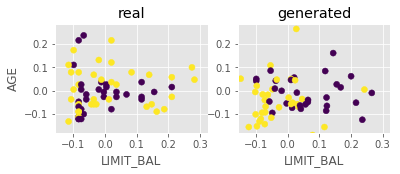

Step: 30300 of 50001.
Losses: G, D Gen, D Real: 0.6820, 0.6550, 0.6716
D Real - D Gen: 0.0166


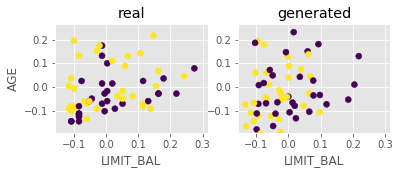

Step: 30400 of 50001.
Losses: G, D Gen, D Real: 0.6215, 0.6420, 0.6851
D Real - D Gen: 0.0431


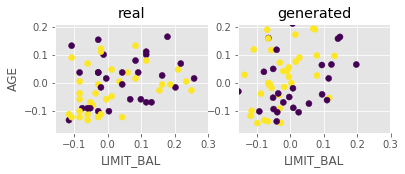

Step: 30500 of 50001.
Losses: G, D Gen, D Real: 0.7127, 0.6637, 0.6882
D Real - D Gen: 0.0246


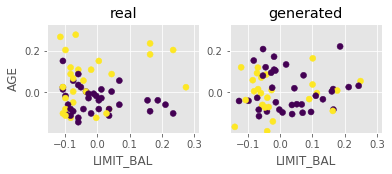

Step: 30600 of 50001.
Losses: G, D Gen, D Real: 0.6576, 0.6329, 0.6531
D Real - D Gen: 0.0202


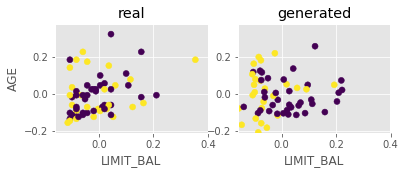

Step: 30700 of 50001.
Losses: G, D Gen, D Real: 0.8070, 0.6629, 0.6590
D Real - D Gen: -0.0039


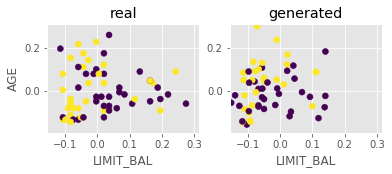

Step: 30800 of 50001.
Losses: G, D Gen, D Real: 0.6916, 0.6428, 0.6348
D Real - D Gen: -0.0079


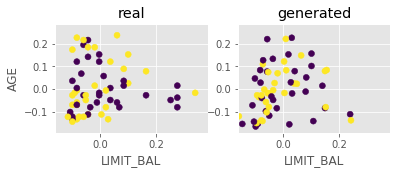

Step: 30900 of 50001.
Losses: G, D Gen, D Real: 0.7232, 0.6639, 0.6799
D Real - D Gen: 0.0160


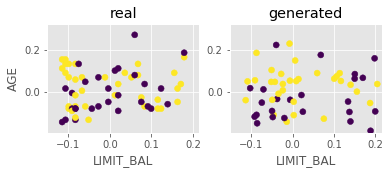

Step: 31000 of 50001.
Losses: G, D Gen, D Real: 0.6692, 0.6389, 0.6189
D Real - D Gen: -0.0200


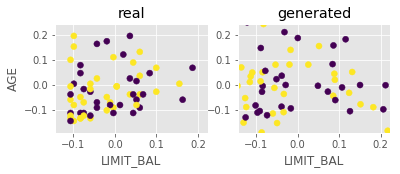

Step: 31100 of 50001.
Losses: G, D Gen, D Real: 0.6124, 0.6182, 0.6369
D Real - D Gen: 0.0187


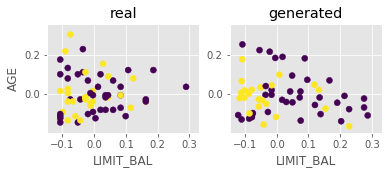

Step: 31200 of 50001.
Losses: G, D Gen, D Real: 0.6667, 0.6344, 0.6138
D Real - D Gen: -0.0206


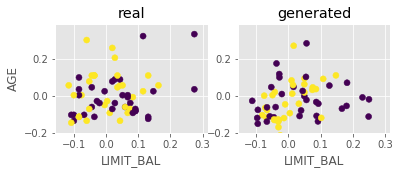

Step: 31300 of 50001.
Losses: G, D Gen, D Real: 0.6113, 0.6570, 0.6424
D Real - D Gen: -0.0145


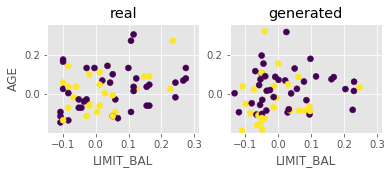

Step: 31400 of 50001.
Losses: G, D Gen, D Real: 0.6151, 0.6787, 0.6259
D Real - D Gen: -0.0529


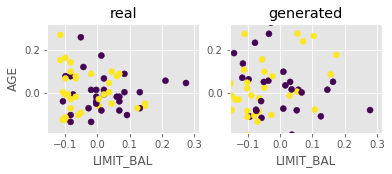

Step: 31500 of 50001.
Losses: G, D Gen, D Real: 0.6648, 0.6304, 0.6570
D Real - D Gen: 0.0266


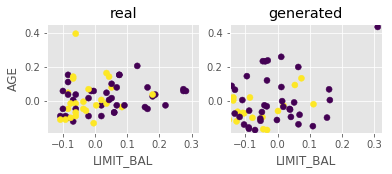

Step: 31600 of 50001.
Losses: G, D Gen, D Real: 0.6826, 0.7001, 0.6987
D Real - D Gen: -0.0013


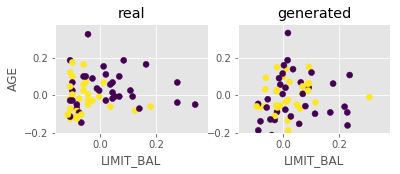

Step: 31700 of 50001.
Losses: G, D Gen, D Real: 0.6717, 0.6615, 0.6480
D Real - D Gen: -0.0135


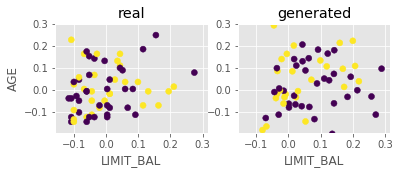

Step: 31800 of 50001.
Losses: G, D Gen, D Real: 0.6907, 0.6333, 0.6634
D Real - D Gen: 0.0302


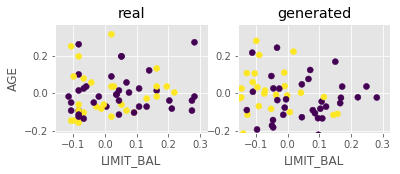

Step: 31900 of 50001.
Losses: G, D Gen, D Real: 0.6226, 0.6374, 0.6669
D Real - D Gen: 0.0295


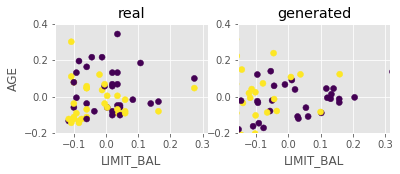

Step: 32000 of 50001.
Losses: G, D Gen, D Real: 0.6734, 0.6400, 0.6707
D Real - D Gen: 0.0307


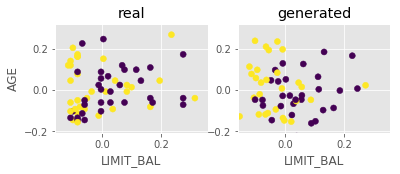

Step: 32100 of 50001.
Losses: G, D Gen, D Real: 0.6285, 0.6173, 0.6582
D Real - D Gen: 0.0409


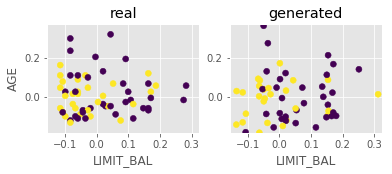

Step: 32200 of 50001.
Losses: G, D Gen, D Real: 0.6855, 0.6612, 0.6638
D Real - D Gen: 0.0026


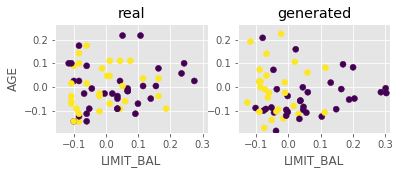

Step: 32300 of 50001.
Losses: G, D Gen, D Real: 0.6197, 0.6665, 0.6450
D Real - D Gen: -0.0215


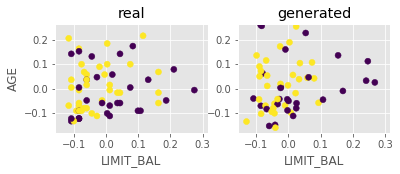

Step: 32400 of 50001.
Losses: G, D Gen, D Real: 0.6813, 0.6996, 0.6426
D Real - D Gen: -0.0571


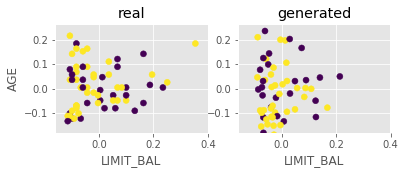

Step: 32500 of 50001.
Losses: G, D Gen, D Real: 0.6253, 0.6840, 0.6525
D Real - D Gen: -0.0315


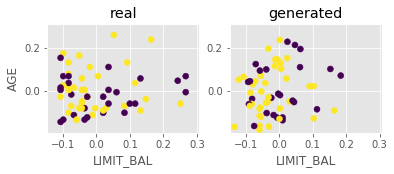

Step: 32600 of 50001.
Losses: G, D Gen, D Real: 0.6767, 0.6874, 0.6756
D Real - D Gen: -0.0118


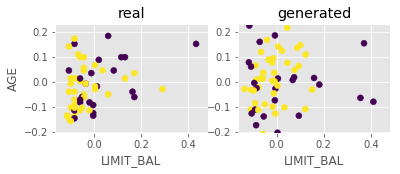

Step: 32700 of 50001.
Losses: G, D Gen, D Real: 0.6505, 0.6638, 0.6754
D Real - D Gen: 0.0116


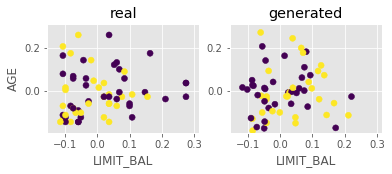

Step: 32800 of 50001.
Losses: G, D Gen, D Real: 0.6907, 0.6547, 0.6743
D Real - D Gen: 0.0196


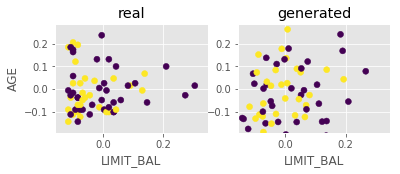

Step: 32900 of 50001.
Losses: G, D Gen, D Real: 0.6342, 0.6616, 0.6601
D Real - D Gen: -0.0014


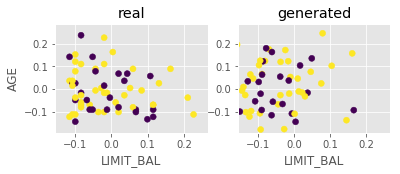

Step: 33000 of 50001.
Losses: G, D Gen, D Real: 0.7110, 0.6950, 0.6625
D Real - D Gen: -0.0325


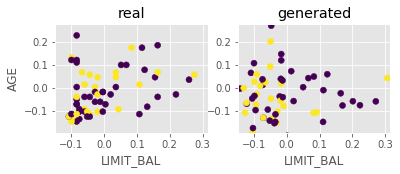

Step: 33100 of 50001.
Losses: G, D Gen, D Real: 0.6592, 0.6365, 0.6928
D Real - D Gen: 0.0563


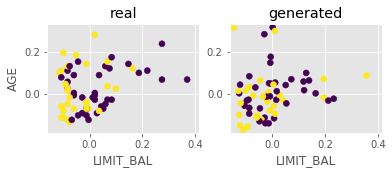

Step: 33200 of 50001.
Losses: G, D Gen, D Real: 0.7707, 0.6513, 0.6440
D Real - D Gen: -0.0073


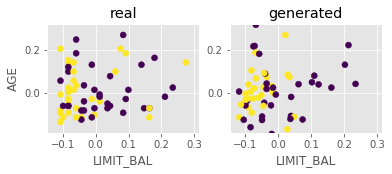

Step: 33300 of 50001.
Losses: G, D Gen, D Real: 0.6742, 0.6378, 0.6256
D Real - D Gen: -0.0122


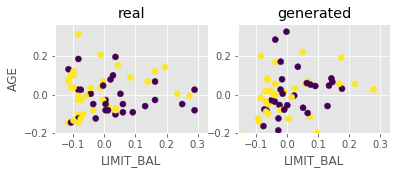

Step: 33400 of 50001.
Losses: G, D Gen, D Real: 0.6637, 0.6927, 0.6587
D Real - D Gen: -0.0340


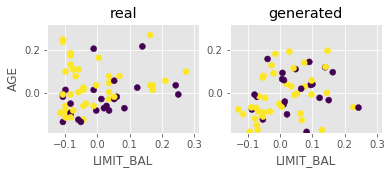

Step: 33500 of 50001.
Losses: G, D Gen, D Real: 0.6388, 0.6657, 0.6110
D Real - D Gen: -0.0547


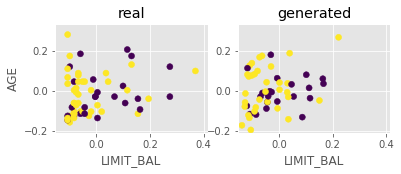

Step: 33600 of 50001.
Losses: G, D Gen, D Real: 0.7665, 0.6401, 0.6449
D Real - D Gen: 0.0048


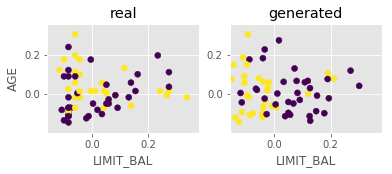

Step: 33700 of 50001.
Losses: G, D Gen, D Real: 0.6432, 0.6693, 0.6538
D Real - D Gen: -0.0156


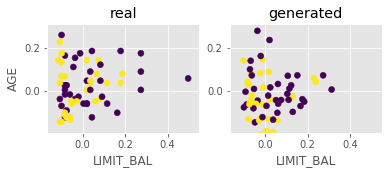

Step: 33800 of 50001.
Losses: G, D Gen, D Real: 0.6119, 0.6172, 0.6363
D Real - D Gen: 0.0190


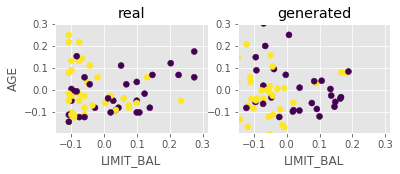

Step: 33900 of 50001.
Losses: G, D Gen, D Real: 0.6340, 0.6305, 0.6999
D Real - D Gen: 0.0694


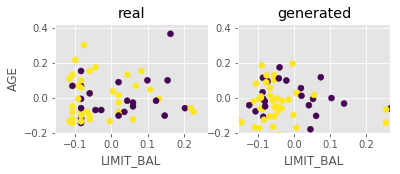

Step: 34000 of 50001.
Losses: G, D Gen, D Real: 0.6076, 0.6285, 0.6655
D Real - D Gen: 0.0369


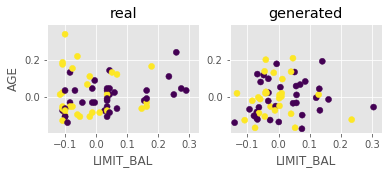

Step: 34100 of 50001.
Losses: G, D Gen, D Real: 0.6410, 0.6641, 0.6778
D Real - D Gen: 0.0137


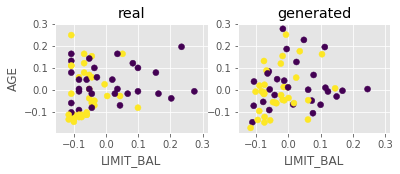

Step: 34200 of 50001.
Losses: G, D Gen, D Real: 0.6157, 0.6695, 0.6660
D Real - D Gen: -0.0035


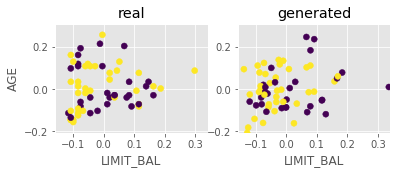

Step: 34300 of 50001.
Losses: G, D Gen, D Real: 0.6674, 0.6394, 0.6643
D Real - D Gen: 0.0248


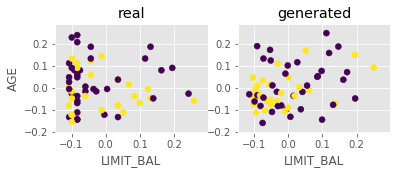

Step: 34400 of 50001.
Losses: G, D Gen, D Real: 0.6316, 0.6294, 0.6289
D Real - D Gen: -0.0005


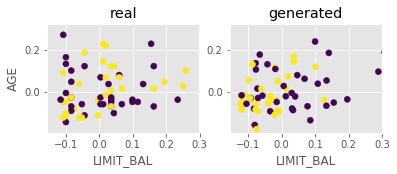

Step: 34500 of 50001.
Losses: G, D Gen, D Real: 0.6481, 0.6675, 0.6719
D Real - D Gen: 0.0044


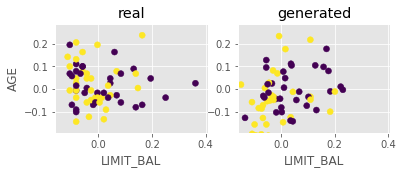

Step: 34600 of 50001.
Losses: G, D Gen, D Real: 0.6174, 0.6552, 0.6275
D Real - D Gen: -0.0277


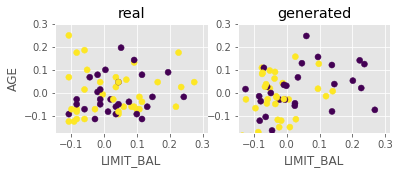

Step: 34700 of 50001.
Losses: G, D Gen, D Real: 0.6641, 0.6335, 0.6577
D Real - D Gen: 0.0242


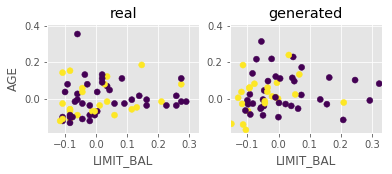

Step: 34800 of 50001.
Losses: G, D Gen, D Real: 0.6093, 0.6437, 0.6848
D Real - D Gen: 0.0411


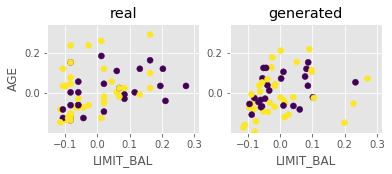

Step: 34900 of 50001.
Losses: G, D Gen, D Real: 0.6326, 0.6444, 0.6710
D Real - D Gen: 0.0266


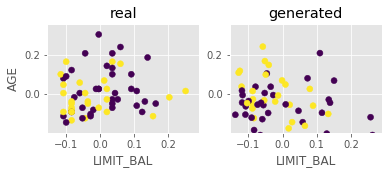

Step: 35000 of 50001.
Losses: G, D Gen, D Real: 0.5685, 0.6462, 0.6400
D Real - D Gen: -0.0062


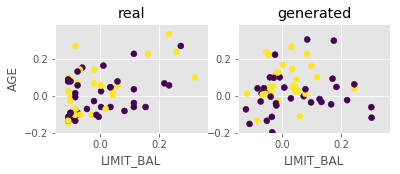

Step: 35100 of 50001.
Losses: G, D Gen, D Real: 0.6839, 0.6954, 0.6617
D Real - D Gen: -0.0337


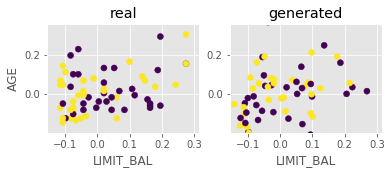

Step: 35200 of 50001.
Losses: G, D Gen, D Real: 0.6096, 0.6982, 0.6623
D Real - D Gen: -0.0359


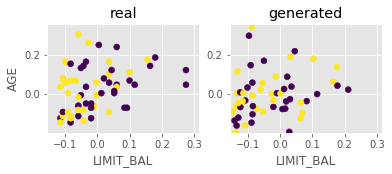

Step: 35300 of 50001.
Losses: G, D Gen, D Real: 0.6736, 0.6530, 0.6639
D Real - D Gen: 0.0109


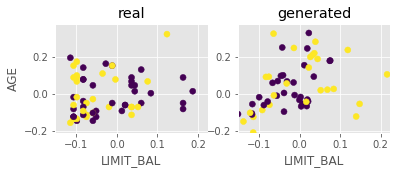

Step: 35400 of 50001.
Losses: G, D Gen, D Real: 0.6023, 0.6425, 0.6458
D Real - D Gen: 0.0033


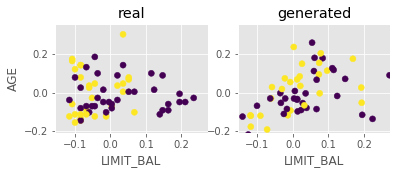

Step: 35500 of 50001.
Losses: G, D Gen, D Real: 0.6968, 0.6636, 0.6769
D Real - D Gen: 0.0133


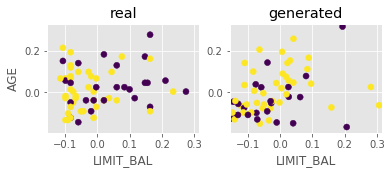

Step: 35600 of 50001.
Losses: G, D Gen, D Real: 0.6281, 0.6789, 0.6668
D Real - D Gen: -0.0121


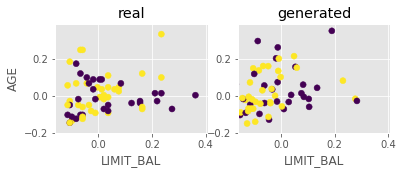

Step: 35700 of 50001.
Losses: G, D Gen, D Real: 0.6963, 0.6646, 0.6773
D Real - D Gen: 0.0128


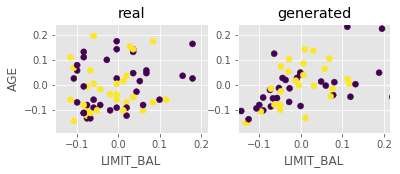

Step: 35800 of 50001.
Losses: G, D Gen, D Real: 0.6533, 0.6358, 0.7044
D Real - D Gen: 0.0686


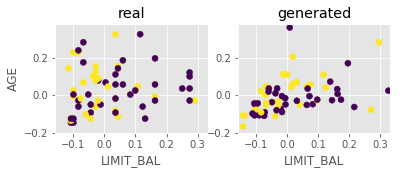

Step: 35900 of 50001.
Losses: G, D Gen, D Real: 0.7051, 0.7166, 0.6590
D Real - D Gen: -0.0576


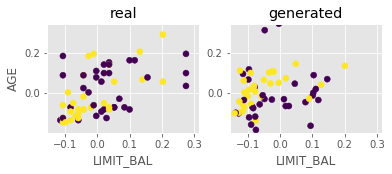

Step: 36000 of 50001.
Losses: G, D Gen, D Real: 0.6178, 0.6548, 0.6917
D Real - D Gen: 0.0370


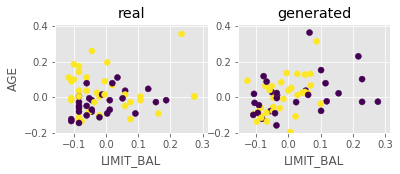

Step: 36100 of 50001.
Losses: G, D Gen, D Real: 0.7077, 0.6610, 0.6795
D Real - D Gen: 0.0185


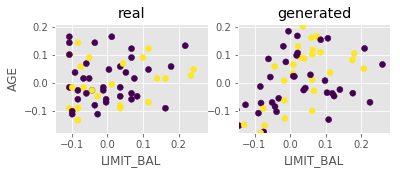

Step: 36200 of 50001.
Losses: G, D Gen, D Real: 0.6311, 0.6222, 0.6276
D Real - D Gen: 0.0053


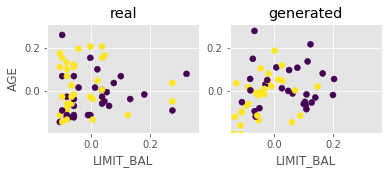

Step: 36300 of 50001.
Losses: G, D Gen, D Real: 0.7566, 0.6605, 0.6562
D Real - D Gen: -0.0043


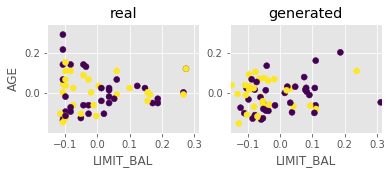

Step: 36400 of 50001.
Losses: G, D Gen, D Real: 0.7056, 0.6682, 0.6905
D Real - D Gen: 0.0223


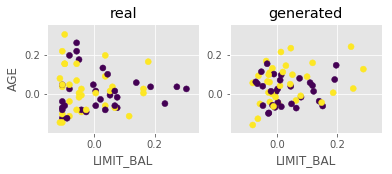

Step: 36500 of 50001.
Losses: G, D Gen, D Real: 0.7013, 0.7088, 0.6790
D Real - D Gen: -0.0298


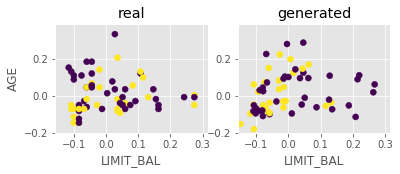

Step: 36600 of 50001.
Losses: G, D Gen, D Real: 0.6244, 0.6182, 0.7015
D Real - D Gen: 0.0833


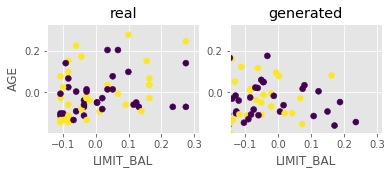

Step: 36700 of 50001.
Losses: G, D Gen, D Real: 0.5660, 0.6469, 0.6711
D Real - D Gen: 0.0242


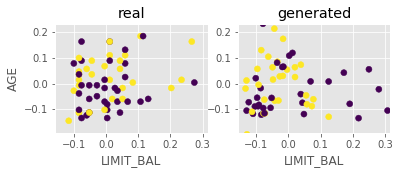

Step: 36800 of 50001.
Losses: G, D Gen, D Real: 0.6094, 0.6427, 0.6797
D Real - D Gen: 0.0370


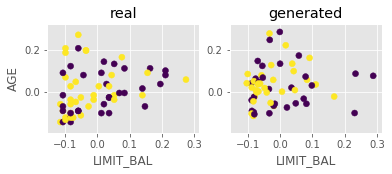

Step: 36900 of 50001.
Losses: G, D Gen, D Real: 0.5345, 0.6409, 0.6370
D Real - D Gen: -0.0040


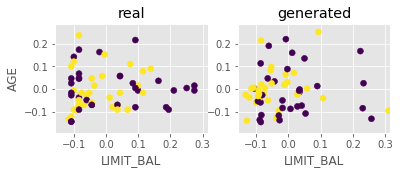

Step: 37000 of 50001.
Losses: G, D Gen, D Real: 0.6633, 0.6229, 0.6963
D Real - D Gen: 0.0734


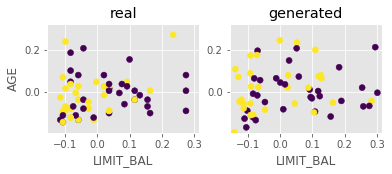

Step: 37100 of 50001.
Losses: G, D Gen, D Real: 0.6360, 0.6450, 0.7104
D Real - D Gen: 0.0654


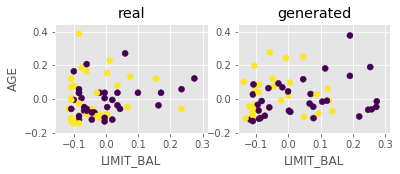

Step: 37200 of 50001.
Losses: G, D Gen, D Real: 0.6871, 0.6651, 0.6666
D Real - D Gen: 0.0015


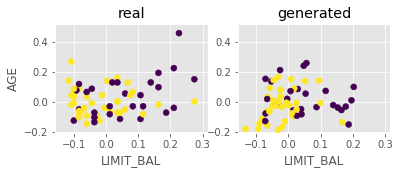

Step: 37300 of 50001.
Losses: G, D Gen, D Real: 0.6217, 0.6575, 0.6497
D Real - D Gen: -0.0078


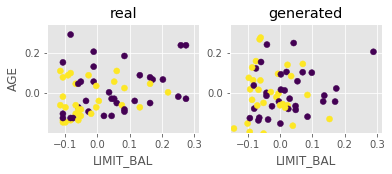

Step: 37400 of 50001.
Losses: G, D Gen, D Real: 0.7048, 0.6502, 0.6893
D Real - D Gen: 0.0391


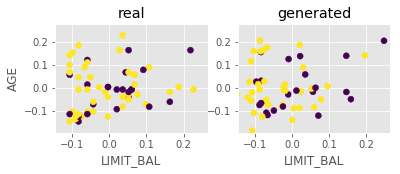

Step: 37500 of 50001.
Losses: G, D Gen, D Real: 0.6206, 0.6067, 0.6534
D Real - D Gen: 0.0467


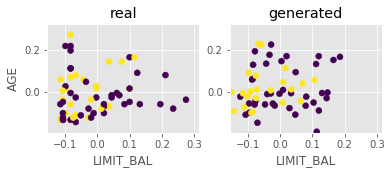

Step: 37600 of 50001.
Losses: G, D Gen, D Real: 0.6231, 0.6604, 0.6890
D Real - D Gen: 0.0286


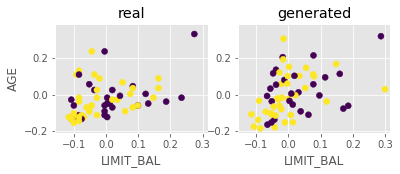

Step: 37700 of 50001.
Losses: G, D Gen, D Real: 0.5855, 0.6340, 0.6518
D Real - D Gen: 0.0177


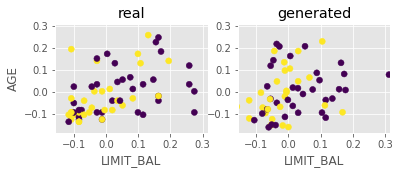

Step: 37800 of 50001.
Losses: G, D Gen, D Real: 0.6747, 0.6514, 0.6496
D Real - D Gen: -0.0018


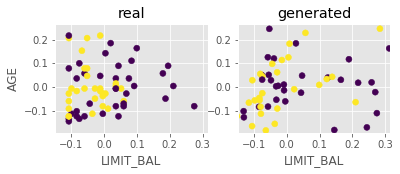

Step: 37900 of 50001.
Losses: G, D Gen, D Real: 0.6014, 0.6153, 0.6568
D Real - D Gen: 0.0415


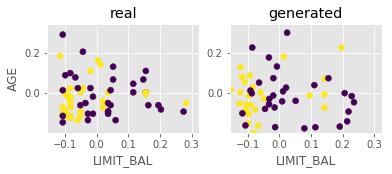

Step: 38000 of 50001.
Losses: G, D Gen, D Real: 0.6685, 0.6205, 0.6858
D Real - D Gen: 0.0652


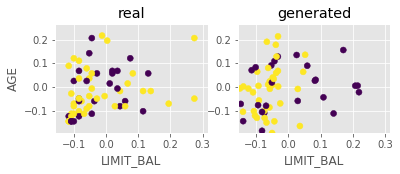

Step: 38100 of 50001.
Losses: G, D Gen, D Real: 0.6453, 0.6088, 0.6565
D Real - D Gen: 0.0477


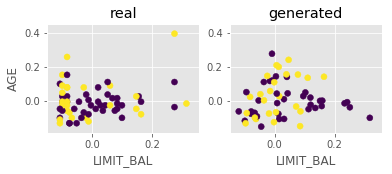

Step: 38200 of 50001.
Losses: G, D Gen, D Real: 0.6901, 0.6758, 0.6767
D Real - D Gen: 0.0010


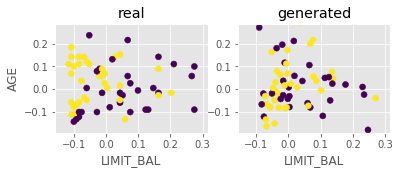

Step: 38300 of 50001.
Losses: G, D Gen, D Real: 0.6179, 0.6631, 0.6615
D Real - D Gen: -0.0016


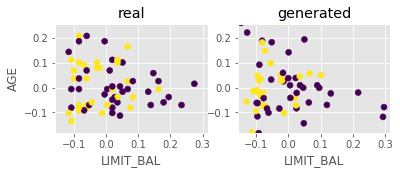

Step: 38400 of 50001.
Losses: G, D Gen, D Real: 0.7122, 0.6501, 0.6852
D Real - D Gen: 0.0351


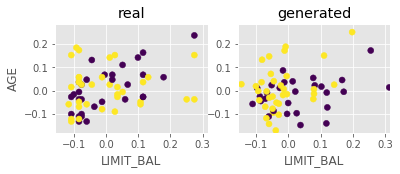

Step: 38500 of 50001.
Losses: G, D Gen, D Real: 0.6365, 0.6398, 0.6896
D Real - D Gen: 0.0498


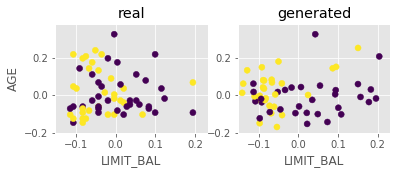

Step: 38600 of 50001.
Losses: G, D Gen, D Real: 0.7236, 0.6787, 0.6624
D Real - D Gen: -0.0163


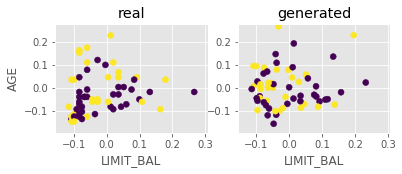

Step: 38700 of 50001.
Losses: G, D Gen, D Real: 0.6388, 0.6716, 0.6772
D Real - D Gen: 0.0056


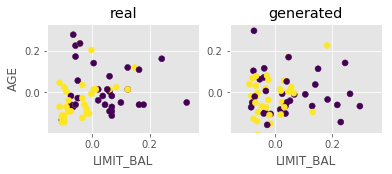

Step: 38800 of 50001.
Losses: G, D Gen, D Real: 0.7342, 0.6645, 0.6674
D Real - D Gen: 0.0029


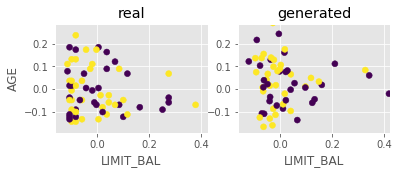

Step: 38900 of 50001.
Losses: G, D Gen, D Real: 0.6387, 0.6416, 0.6864
D Real - D Gen: 0.0448


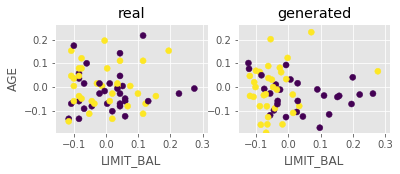

Step: 39000 of 50001.
Losses: G, D Gen, D Real: 0.6998, 0.6939, 0.6807
D Real - D Gen: -0.0133


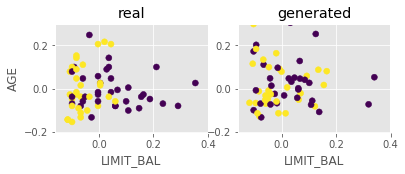

Step: 39100 of 50001.
Losses: G, D Gen, D Real: 0.6116, 0.6603, 0.6508
D Real - D Gen: -0.0095


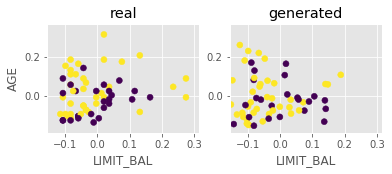

Step: 39200 of 50001.
Losses: G, D Gen, D Real: 0.7116, 0.7253, 0.6680
D Real - D Gen: -0.0572


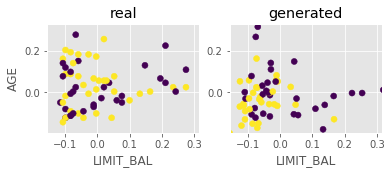

Step: 39300 of 50001.
Losses: G, D Gen, D Real: 0.6176, 0.6663, 0.6419
D Real - D Gen: -0.0244


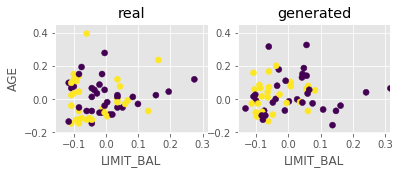

Step: 39400 of 50001.
Losses: G, D Gen, D Real: 0.6066, 0.6424, 0.6446
D Real - D Gen: 0.0022


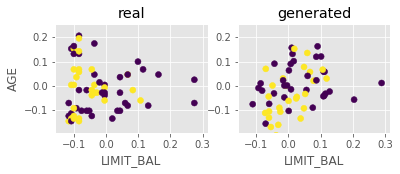

Step: 39500 of 50001.
Losses: G, D Gen, D Real: 0.6620, 0.6430, 0.6098
D Real - D Gen: -0.0332


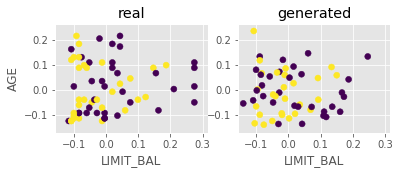

Step: 39600 of 50001.
Losses: G, D Gen, D Real: 0.6003, 0.6298, 0.6358
D Real - D Gen: 0.0061


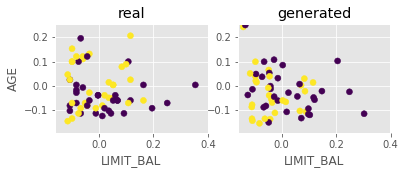

Step: 39700 of 50001.
Losses: G, D Gen, D Real: 0.6622, 0.6340, 0.6278
D Real - D Gen: -0.0062


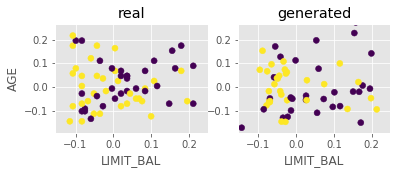

Step: 39800 of 50001.
Losses: G, D Gen, D Real: 0.6229, 0.6398, 0.6857
D Real - D Gen: 0.0460


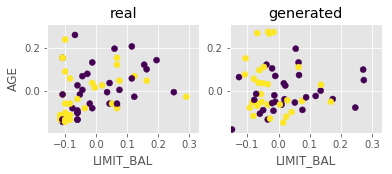

Step: 39900 of 50001.
Losses: G, D Gen, D Real: 0.6751, 0.6545, 0.6785
D Real - D Gen: 0.0240


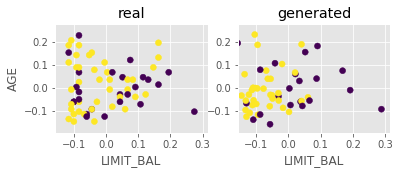

Step: 40000 of 50001.
Losses: G, D Gen, D Real: 0.6190, 0.6516, 0.6433
D Real - D Gen: -0.0083


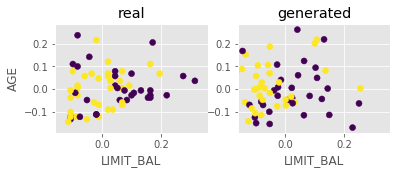

Step: 40100 of 50001.
Losses: G, D Gen, D Real: 0.6789, 0.6602, 0.6745
D Real - D Gen: 0.0144


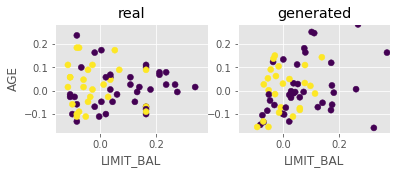

Step: 40200 of 50001.
Losses: G, D Gen, D Real: 0.5914, 0.6754, 0.6434
D Real - D Gen: -0.0320


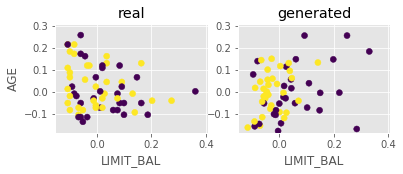

Step: 40300 of 50001.
Losses: G, D Gen, D Real: 0.7055, 0.6343, 0.6734
D Real - D Gen: 0.0391


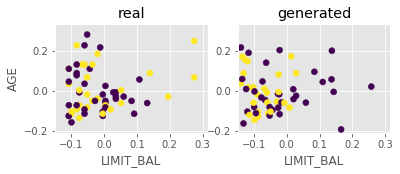

Step: 40400 of 50001.
Losses: G, D Gen, D Real: 0.6248, 0.6599, 0.7026
D Real - D Gen: 0.0426


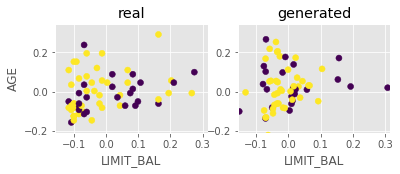

Step: 40500 of 50001.
Losses: G, D Gen, D Real: 0.7035, 0.6551, 0.6557
D Real - D Gen: 0.0006


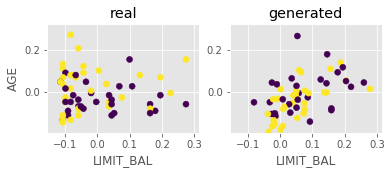

Step: 40600 of 50001.
Losses: G, D Gen, D Real: 0.6329, 0.6439, 0.6145
D Real - D Gen: -0.0294


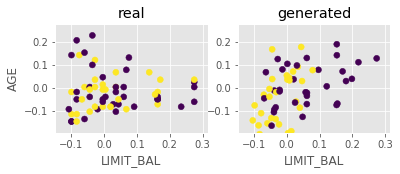

Step: 40700 of 50001.
Losses: G, D Gen, D Real: 0.6726, 0.6682, 0.6672
D Real - D Gen: -0.0011


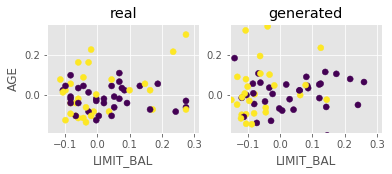

Step: 40800 of 50001.
Losses: G, D Gen, D Real: 0.6358, 0.6650, 0.6387
D Real - D Gen: -0.0263


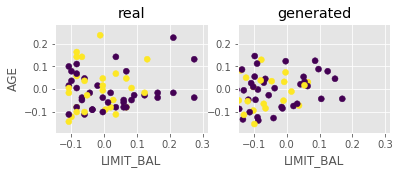

Step: 40900 of 50001.
Losses: G, D Gen, D Real: 0.6992, 0.6514, 0.6627
D Real - D Gen: 0.0113


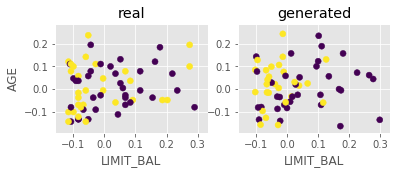

Step: 41000 of 50001.
Losses: G, D Gen, D Real: 0.6225, 0.6444, 0.6617
D Real - D Gen: 0.0173


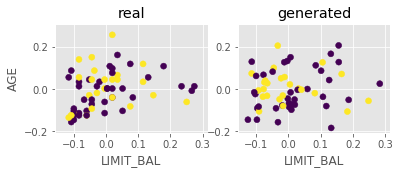

Step: 41100 of 50001.
Losses: G, D Gen, D Real: 0.6690, 0.6687, 0.6685
D Real - D Gen: -0.0002


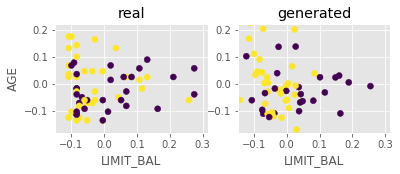

Step: 41200 of 50001.
Losses: G, D Gen, D Real: 0.6285, 0.6331, 0.6312
D Real - D Gen: -0.0018


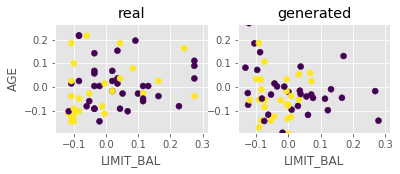

Step: 41300 of 50001.
Losses: G, D Gen, D Real: 0.6388, 0.6877, 0.6554
D Real - D Gen: -0.0323


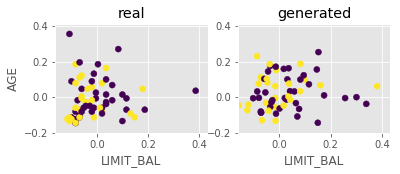

Step: 41400 of 50001.
Losses: G, D Gen, D Real: 0.5933, 0.6588, 0.6260
D Real - D Gen: -0.0328


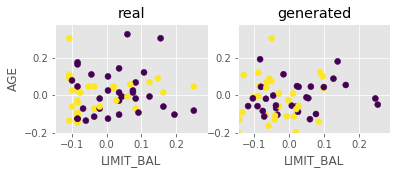

Step: 41500 of 50001.
Losses: G, D Gen, D Real: 0.6659, 0.6727, 0.6929
D Real - D Gen: 0.0202


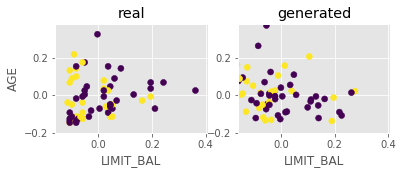

Step: 41600 of 50001.
Losses: G, D Gen, D Real: 0.6209, 0.6446, 0.6764
D Real - D Gen: 0.0318


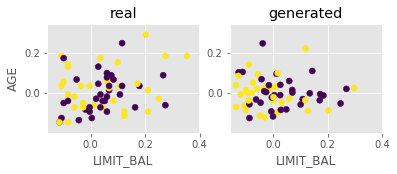

Step: 41700 of 50001.
Losses: G, D Gen, D Real: 0.7472, 0.6807, 0.6374
D Real - D Gen: -0.0432


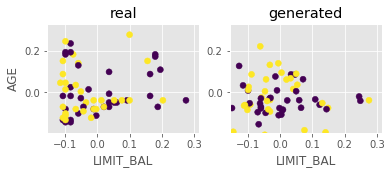

Step: 41800 of 50001.
Losses: G, D Gen, D Real: 0.6141, 0.6410, 0.6785
D Real - D Gen: 0.0375


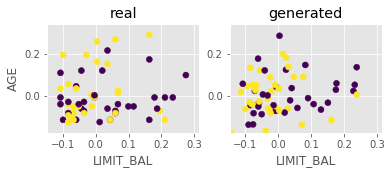

Step: 41900 of 50001.
Losses: G, D Gen, D Real: 0.7290, 0.7020, 0.6779
D Real - D Gen: -0.0240


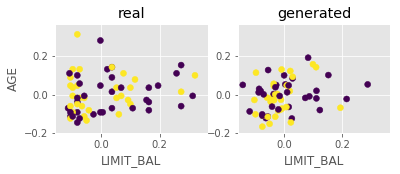

Step: 42000 of 50001.
Losses: G, D Gen, D Real: 0.6350, 0.6479, 0.6856
D Real - D Gen: 0.0377


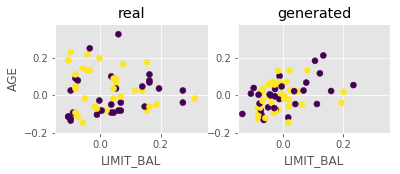

Step: 42100 of 50001.
Losses: G, D Gen, D Real: 0.7039, 0.6800, 0.6497
D Real - D Gen: -0.0303


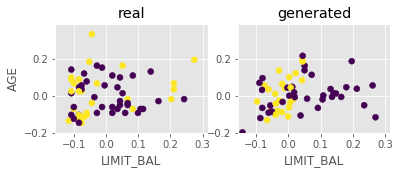

Step: 42200 of 50001.
Losses: G, D Gen, D Real: 0.6405, 0.6350, 0.6602
D Real - D Gen: 0.0252


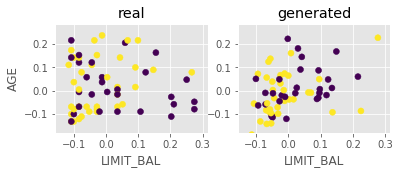

Step: 42300 of 50001.
Losses: G, D Gen, D Real: 0.5946, 0.6353, 0.6702
D Real - D Gen: 0.0349


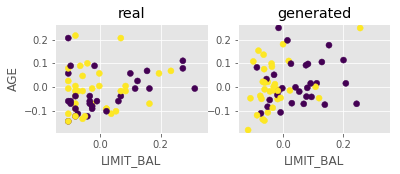

Step: 42400 of 50001.
Losses: G, D Gen, D Real: 0.6487, 0.6719, 0.6384
D Real - D Gen: -0.0335


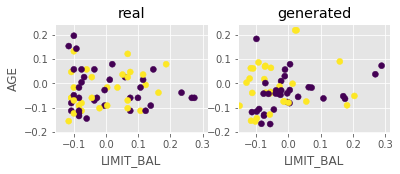

Step: 42500 of 50001.
Losses: G, D Gen, D Real: 0.6460, 0.6449, 0.6618
D Real - D Gen: 0.0169


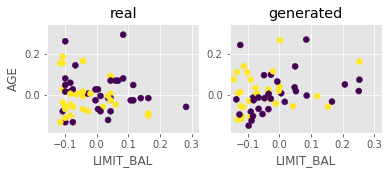

Step: 42600 of 50001.
Losses: G, D Gen, D Real: 0.6410, 0.6452, 0.6367
D Real - D Gen: -0.0085


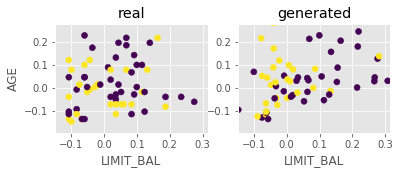

Step: 42700 of 50001.
Losses: G, D Gen, D Real: 0.5961, 0.6343, 0.6699
D Real - D Gen: 0.0356


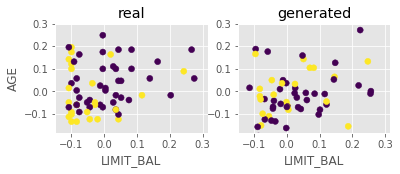

Step: 42800 of 50001.
Losses: G, D Gen, D Real: 0.6433, 0.6316, 0.6544
D Real - D Gen: 0.0228


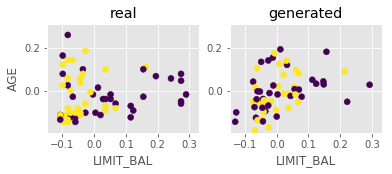

Step: 42900 of 50001.
Losses: G, D Gen, D Real: 0.5857, 0.6578, 0.6289
D Real - D Gen: -0.0289


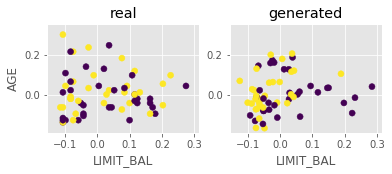

Step: 43000 of 50001.
Losses: G, D Gen, D Real: 0.6399, 0.6588, 0.6636
D Real - D Gen: 0.0048


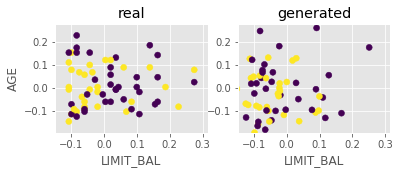

Step: 43100 of 50001.
Losses: G, D Gen, D Real: 0.6220, 0.6681, 0.6220
D Real - D Gen: -0.0461


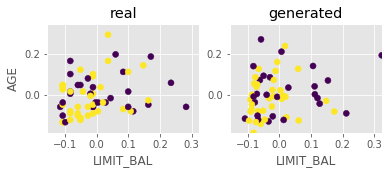

Step: 43200 of 50001.
Losses: G, D Gen, D Real: 0.6623, 0.6412, 0.6808
D Real - D Gen: 0.0397


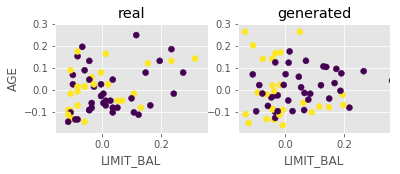

Step: 43300 of 50001.
Losses: G, D Gen, D Real: 0.6212, 0.6352, 0.6912
D Real - D Gen: 0.0560


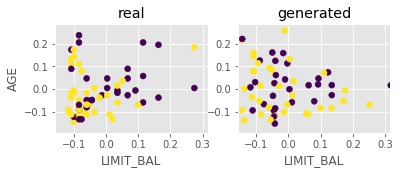

Step: 43400 of 50001.
Losses: G, D Gen, D Real: 0.6820, 0.6310, 0.6417
D Real - D Gen: 0.0107


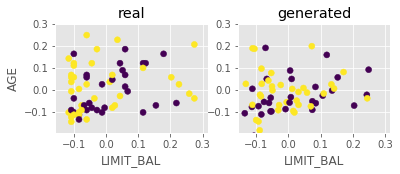

Step: 43500 of 50001.
Losses: G, D Gen, D Real: 0.6064, 0.6270, 0.6531
D Real - D Gen: 0.0261


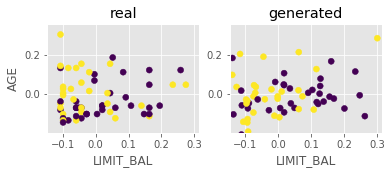

Step: 43600 of 50001.
Losses: G, D Gen, D Real: 0.6609, 0.6738, 0.6687
D Real - D Gen: -0.0051


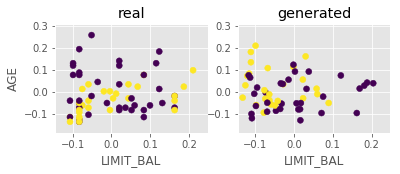

Step: 43700 of 50001.
Losses: G, D Gen, D Real: 0.6381, 0.6556, 0.6604
D Real - D Gen: 0.0048


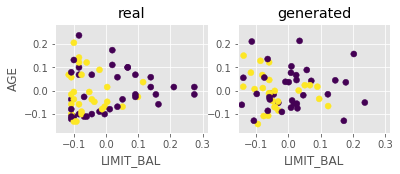

Step: 43800 of 50001.
Losses: G, D Gen, D Real: 0.6735, 0.6732, 0.6560
D Real - D Gen: -0.0172


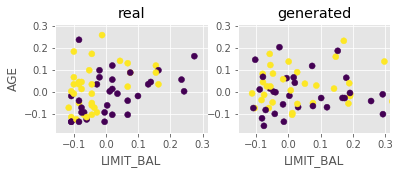

Step: 43900 of 50001.
Losses: G, D Gen, D Real: 0.6512, 0.6151, 0.6755
D Real - D Gen: 0.0604


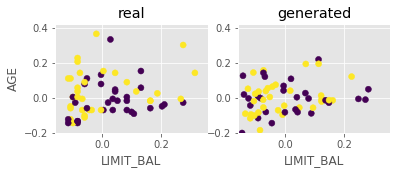

Step: 44000 of 50001.
Losses: G, D Gen, D Real: 0.6785, 0.6580, 0.6536
D Real - D Gen: -0.0044


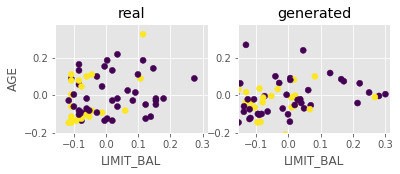

Step: 44100 of 50001.
Losses: G, D Gen, D Real: 0.6120, 0.6334, 0.6214
D Real - D Gen: -0.0120


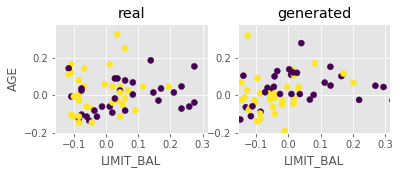

Step: 44200 of 50001.
Losses: G, D Gen, D Real: 0.6743, 0.6616, 0.6634
D Real - D Gen: 0.0018


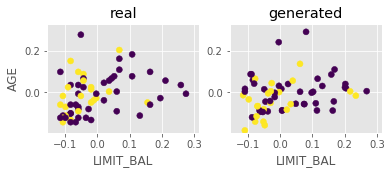

Step: 44300 of 50001.
Losses: G, D Gen, D Real: 0.6109, 0.6414, 0.6801
D Real - D Gen: 0.0387


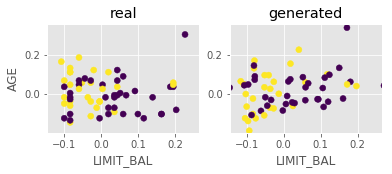

Step: 44400 of 50001.
Losses: G, D Gen, D Real: 0.6642, 0.6668, 0.6880
D Real - D Gen: 0.0211


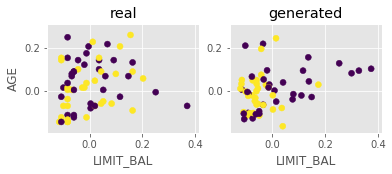

Step: 44500 of 50001.
Losses: G, D Gen, D Real: 0.6813, 0.6549, 0.6544
D Real - D Gen: -0.0005


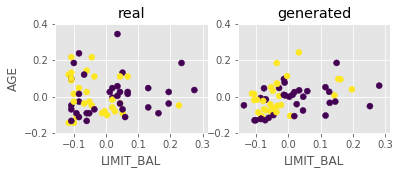

Step: 44600 of 50001.
Losses: G, D Gen, D Real: 0.6997, 0.6770, 0.6502
D Real - D Gen: -0.0268


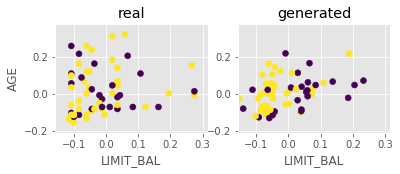

Step: 44700 of 50001.
Losses: G, D Gen, D Real: 0.6447, 0.6345, 0.6589
D Real - D Gen: 0.0244


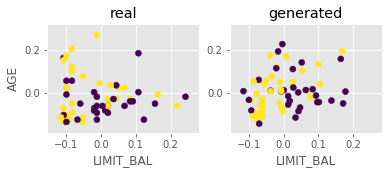

Step: 44800 of 50001.
Losses: G, D Gen, D Real: 0.7079, 0.6627, 0.6477
D Real - D Gen: -0.0150


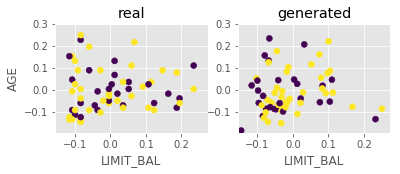

Step: 44900 of 50001.
Losses: G, D Gen, D Real: 0.6442, 0.6628, 0.6998
D Real - D Gen: 0.0370


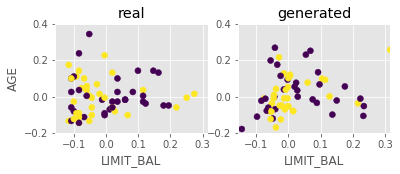

Step: 45000 of 50001.
Losses: G, D Gen, D Real: 0.5890, 0.6698, 0.6347
D Real - D Gen: -0.0351


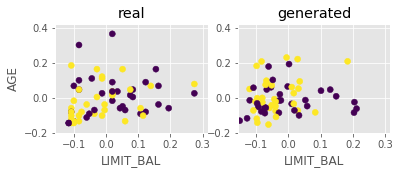

Step: 45100 of 50001.
Losses: G, D Gen, D Real: 0.6371, 0.6544, 0.6449
D Real - D Gen: -0.0095


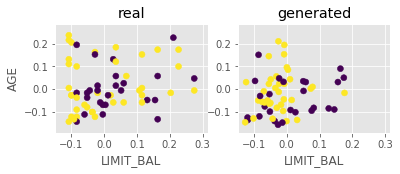

Step: 45200 of 50001.
Losses: G, D Gen, D Real: 0.5839, 0.6664, 0.6515
D Real - D Gen: -0.0149


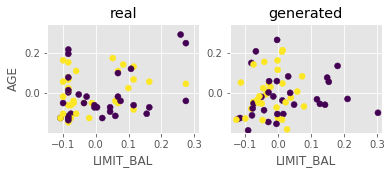

Step: 45300 of 50001.
Losses: G, D Gen, D Real: 0.6483, 0.6614, 0.6422
D Real - D Gen: -0.0192


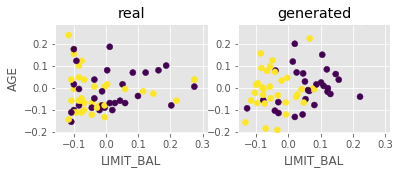

Step: 45400 of 50001.
Losses: G, D Gen, D Real: 0.5676, 0.6644, 0.6458
D Real - D Gen: -0.0186


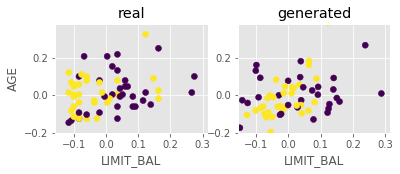

Step: 45500 of 50001.
Losses: G, D Gen, D Real: 0.6864, 0.6186, 0.6369
D Real - D Gen: 0.0183


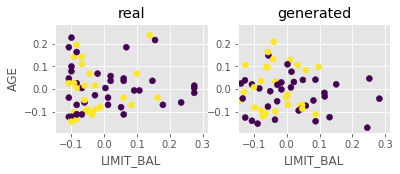

Step: 45600 of 50001.
Losses: G, D Gen, D Real: 0.5855, 0.6275, 0.6688
D Real - D Gen: 0.0413


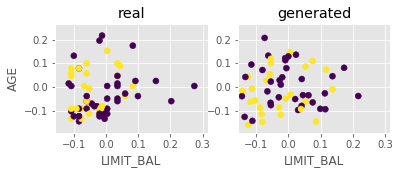

Step: 45700 of 50001.
Losses: G, D Gen, D Real: 0.6270, 0.6289, 0.6534
D Real - D Gen: 0.0245


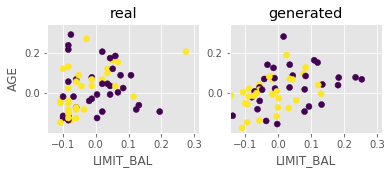

Step: 45800 of 50001.
Losses: G, D Gen, D Real: 0.6154, 0.6534, 0.6558
D Real - D Gen: 0.0023


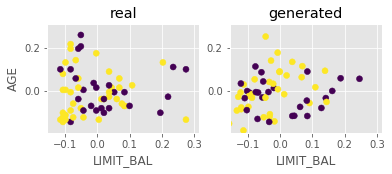

Step: 45900 of 50001.
Losses: G, D Gen, D Real: 0.6366, 0.6908, 0.6445
D Real - D Gen: -0.0463


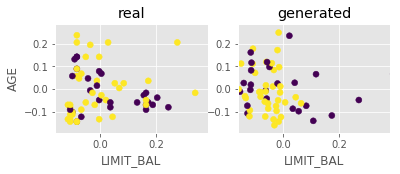

Step: 46000 of 50001.
Losses: G, D Gen, D Real: 0.5829, 0.6629, 0.6086
D Real - D Gen: -0.0543


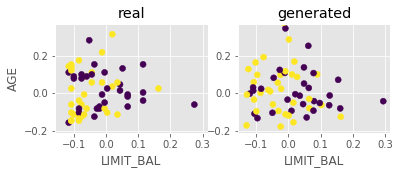

Step: 46100 of 50001.
Losses: G, D Gen, D Real: 0.6330, 0.6331, 0.6201
D Real - D Gen: -0.0130


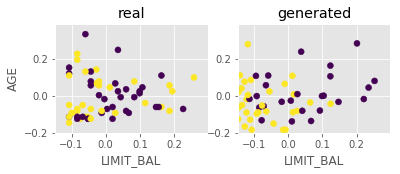

Step: 46200 of 50001.
Losses: G, D Gen, D Real: 0.5960, 0.6318, 0.6445
D Real - D Gen: 0.0127


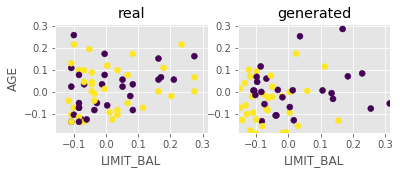

Step: 46300 of 50001.
Losses: G, D Gen, D Real: 0.7152, 0.6271, 0.6035
D Real - D Gen: -0.0236


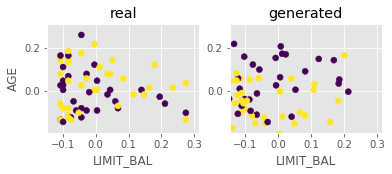

Step: 46400 of 50001.
Losses: G, D Gen, D Real: 0.6187, 0.6453, 0.6301
D Real - D Gen: -0.0153


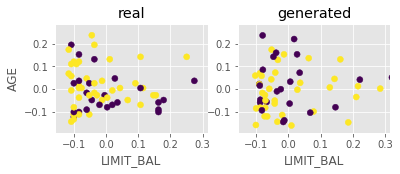

Step: 46500 of 50001.
Losses: G, D Gen, D Real: 0.6415, 0.6909, 0.6361
D Real - D Gen: -0.0548


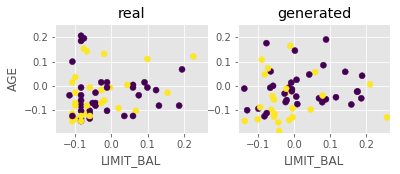

Step: 46600 of 50001.
Losses: G, D Gen, D Real: 0.5753, 0.6780, 0.6036
D Real - D Gen: -0.0744


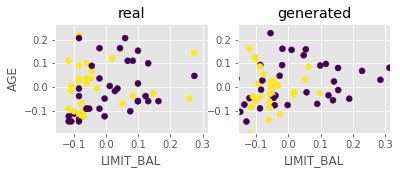

Step: 46700 of 50001.
Losses: G, D Gen, D Real: 0.6966, 0.6684, 0.6760
D Real - D Gen: 0.0076


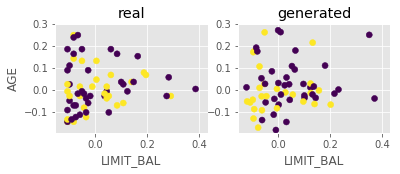

Step: 46800 of 50001.
Losses: G, D Gen, D Real: 0.6023, 0.6555, 0.6872
D Real - D Gen: 0.0317


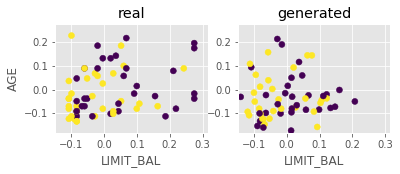

Step: 46900 of 50001.
Losses: G, D Gen, D Real: 0.6838, 0.6289, 0.6516
D Real - D Gen: 0.0228


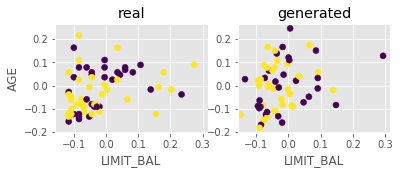

Step: 47000 of 50001.
Losses: G, D Gen, D Real: 0.5696, 0.6117, 0.5936
D Real - D Gen: -0.0181


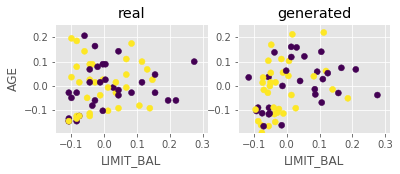

Step: 47100 of 50001.
Losses: G, D Gen, D Real: 0.6668, 0.7011, 0.6091
D Real - D Gen: -0.0920


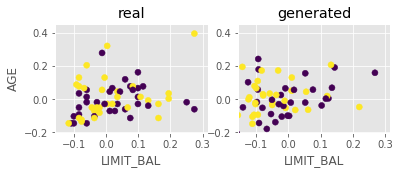

Step: 47200 of 50001.
Losses: G, D Gen, D Real: 0.6158, 0.6267, 0.6410
D Real - D Gen: 0.0144


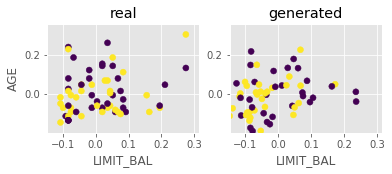

Step: 47300 of 50001.
Losses: G, D Gen, D Real: 0.7447, 0.6365, 0.6567
D Real - D Gen: 0.0202


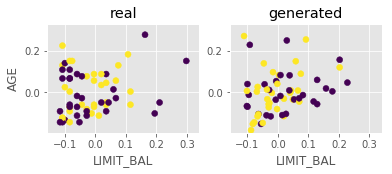

Step: 47400 of 50001.
Losses: G, D Gen, D Real: 0.5978, 0.6503, 0.6208
D Real - D Gen: -0.0295


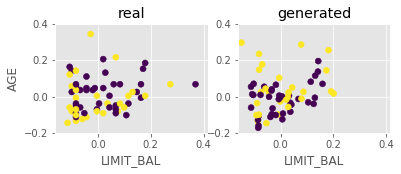

Step: 47500 of 50001.
Losses: G, D Gen, D Real: 0.6944, 0.7092, 0.6367
D Real - D Gen: -0.0725


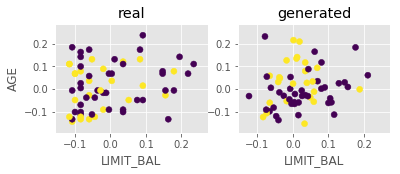

Step: 47600 of 50001.
Losses: G, D Gen, D Real: 0.5937, 0.6468, 0.6436
D Real - D Gen: -0.0032


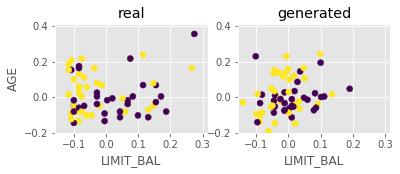

Step: 47700 of 50001.
Losses: G, D Gen, D Real: 0.6972, 0.6718, 0.6194
D Real - D Gen: -0.0525


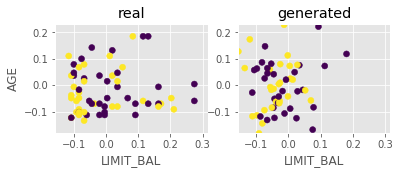

Step: 47800 of 50001.
Losses: G, D Gen, D Real: 0.5851, 0.6446, 0.6680
D Real - D Gen: 0.0233


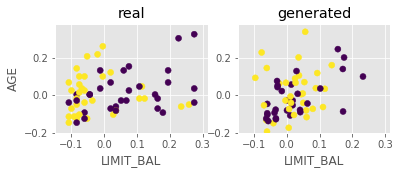

Step: 47900 of 50001.
Losses: G, D Gen, D Real: 0.5815, 0.6283, 0.6541
D Real - D Gen: 0.0258


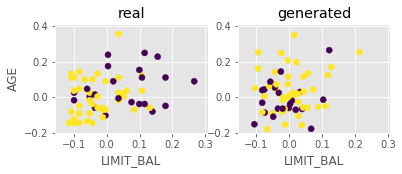

Step: 48000 of 50001.
Losses: G, D Gen, D Real: 0.6098, 0.6407, 0.6651
D Real - D Gen: 0.0244


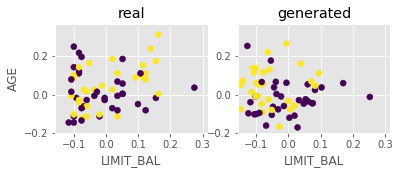

Step: 48100 of 50001.
Losses: G, D Gen, D Real: 0.5595, 0.6464, 0.6619
D Real - D Gen: 0.0155


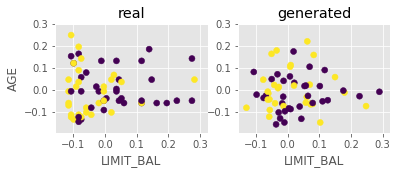

Step: 48200 of 50001.
Losses: G, D Gen, D Real: 0.6650, 0.5942, 0.6512
D Real - D Gen: 0.0570


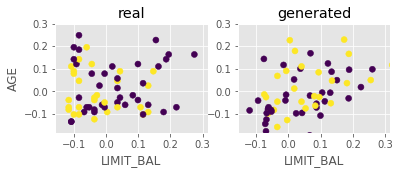

Step: 48300 of 50001.
Losses: G, D Gen, D Real: 0.5865, 0.6043, 0.6702
D Real - D Gen: 0.0659


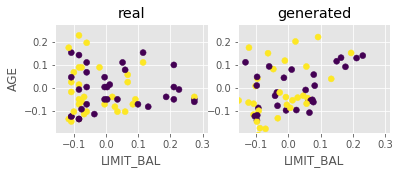

Step: 48400 of 50001.
Losses: G, D Gen, D Real: 0.6786, 0.6308, 0.6435
D Real - D Gen: 0.0127


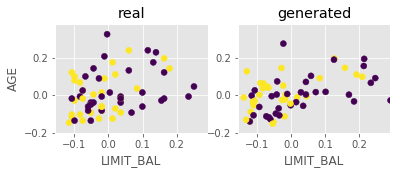

Step: 48500 of 50001.
Losses: G, D Gen, D Real: 0.5814, 0.5937, 0.6724
D Real - D Gen: 0.0787


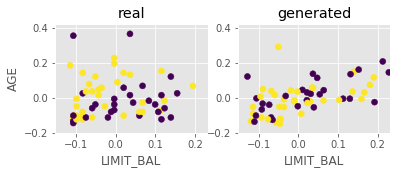

Step: 48600 of 50001.
Losses: G, D Gen, D Real: 0.6955, 0.6342, 0.6941
D Real - D Gen: 0.0598


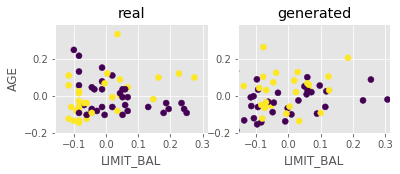

Step: 48700 of 50001.
Losses: G, D Gen, D Real: 0.5963, 0.6568, 0.6234
D Real - D Gen: -0.0333


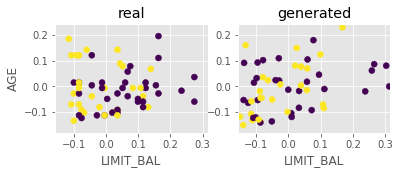

Step: 48800 of 50001.
Losses: G, D Gen, D Real: 0.6539, 0.6651, 0.6698
D Real - D Gen: 0.0047


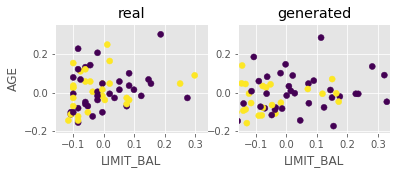

Step: 48900 of 50001.
Losses: G, D Gen, D Real: 0.6144, 0.6196, 0.6378
D Real - D Gen: 0.0181


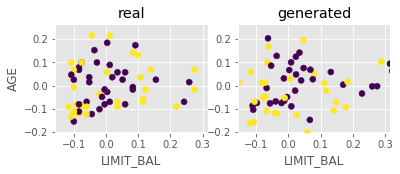

Step: 49000 of 50001.
Losses: G, D Gen, D Real: 0.7034, 0.6451, 0.6181
D Real - D Gen: -0.0270


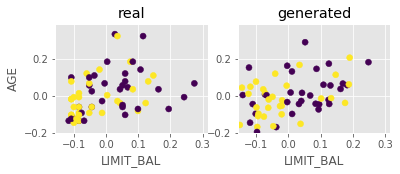

Step: 49100 of 50001.
Losses: G, D Gen, D Real: 0.5618, 0.6070, 0.6057
D Real - D Gen: -0.0013


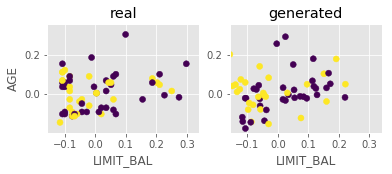

Step: 49200 of 50001.
Losses: G, D Gen, D Real: 0.6490, 0.6491, 0.6293
D Real - D Gen: -0.0198


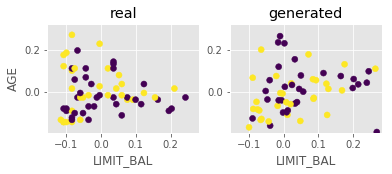

Step: 49300 of 50001.
Losses: G, D Gen, D Real: 0.6413, 0.6443, 0.6888
D Real - D Gen: 0.0445


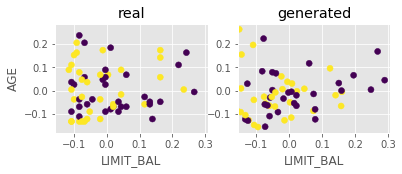

Step: 49400 of 50001.
Losses: G, D Gen, D Real: 0.7242, 0.7018, 0.6057
D Real - D Gen: -0.0961


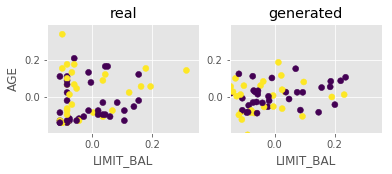

Step: 49500 of 50001.
Losses: G, D Gen, D Real: 0.6251, 0.6588, 0.6340
D Real - D Gen: -0.0248


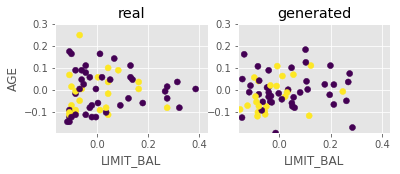

Step: 49600 of 50001.
Losses: G, D Gen, D Real: 0.7007, 0.6355, 0.6669
D Real - D Gen: 0.0314


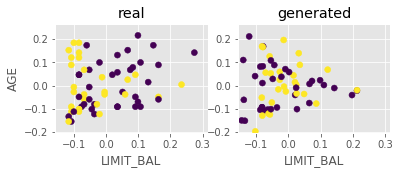

Step: 49700 of 50001.
Losses: G, D Gen, D Real: 0.6102, 0.6538, 0.6287
D Real - D Gen: -0.0252


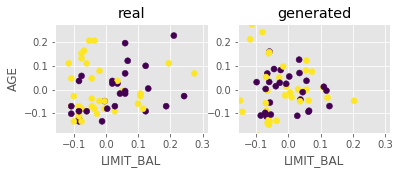

Step: 49800 of 50001.
Losses: G, D Gen, D Real: 0.6909, 0.6904, 0.6481
D Real - D Gen: -0.0423


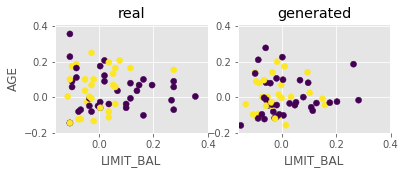

Step: 49900 of 50001.
Losses: G, D Gen, D Real: 0.6052, 0.6487, 0.6587
D Real - D Gen: 0.0100


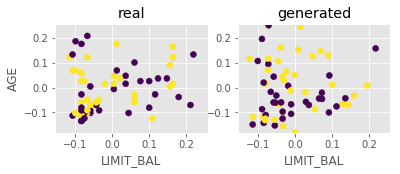

Step: 50000 of 50001.
Losses: G, D Gen, D Real: 0.7316, 0.6507, 0.6170
D Real - D Gen: -0.0337


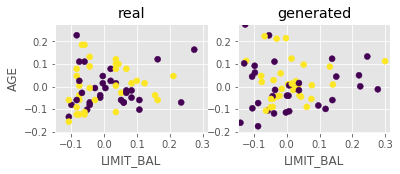

Wall time: 18min 41s


In [52]:
%%time

# Training the CGAN architecture

k_d = 1  # number of critic network updates per adversarial training step
learning_rate = 5e-5 # 5e-5
arguments = [rand_dim, nb_steps, batch_size, 
             k_d, k_g, critic_pre_train_steps, log_interval, learning_rate, base_n_count,
            data_dir, generator_model_path, discriminator_model_path, loss_pickle_path, show ]

adversarial_training_GAN(arguments, train, data_cols=data_cols, label_cols=label_cols ) # CGAN

# Generated Data

In [46]:
# Let's look at some of the generated data
# First create the networks locally and load the weights

import CGAN
import importlib
importlib.reload(CGAN) # For reloading after making changes
from CGAN import *

rand_dim = 100
base_n_count = 30 
seed = 17

data_dim = len(data_cols)
label_dim = len(label_cols)
with_class = False
if label_dim > 0: with_class = True
np.random.seed(seed)

# define network models

generator_model, discriminator_model, combined_model = define_models_CGAN(rand_dim, data_dim, label_dim, base_n_count)
generator_model.load_weights('./cache/credit_balanced/CGAN_generator_model_weights_step_50000.h5')


Instructions for updating:
Colocations handled automatically by placer.


In [47]:
# Now generate some new data

test_size = 13272 

z = np.random.normal(size=(test_size, rand_dim))
if with_class:
    labels = data[label_cols]
    g_z = generator_model.predict([z, labels])
else:
    g_z = generator_model.predict(z)

In [48]:
real_samples = data
fake_samples = pd.DataFrame(g_z, columns=data_cols+label_cols)

fake_samples.to_excel('./data/credit_balanced/fake.xlsx')
real_samples.to_excel('./data/credit_balanced/real.xlsx')

In [5]:
real_samples = pd.read_excel('./data/credit_balanced/real.xlsx')
fake_samples = pd.read_excel('./data/credit_balanced/fake.xlsx')

# Correlation between variables of two datasets

## Pearson Correlation Index

In [6]:
pearson = real_samples.corrwith(fake_samples)
pearson.to_excel('./res.xlsx')
pearson

Unnamed: 0                    1.000000
LIMIT_BAL                     0.017105
AGE                           0.005753
PAY_0                         0.131883
PAY_2                         0.045900
PAY_3                         0.033135
PAY_4                         0.057911
PAY_5                         0.085556
PAY_6                         0.066664
BILL_AMT1                     0.011722
BILL_AMT2                     0.009409
BILL_AMT3                     0.017635
BILL_AMT4                     0.018264
BILL_AMT5                     0.016455
BILL_AMT6                     0.011980
PAY_AMT1                      0.006749
PAY_AMT2                      0.012357
PAY_AMT3                      0.015467
PAY_AMT4                      0.005801
PAY_AMT5                      0.005025
PAY_AMT6                     -0.005714
default payment next month    1.000000
dtype: float64

## Covariance

In [53]:
columnas = real_samples.columns.values
covarianza = []
for col in columnas:
    covarianza.append(np.cov(real_samples[col], fake_samples[col])[0][1])
    print(col + ":       " +  str(np.cov(real_samples[col], fake_samples[col])[0][1]))
    
pd.Series(covarianza).to_excel('./res.xlsx')
    

LIMIT_BAL:       0.0017488381286084895
AGE:       0.0005818514669667546
PAY_0:       0.01639501790584031
PAY_2:       0.005028589620952908
PAY_3:       0.0030978882667789787
PAY_4:       0.005427835609572291
PAY_5:       0.010516256934158705
PAY_6:       0.0064026420224929225
BILL_AMT1:       0.0008150485271734765
BILL_AMT2:       0.00078989541693596
BILL_AMT3:       0.0015448962692576865
BILL_AMT4:       0.0017072649499470728
BILL_AMT5:       0.0015897506620823944
BILL_AMT6:       0.0011299780103688915
PAY_AMT1:       0.0008722997424969411
PAY_AMT2:       0.0006176903849553034
PAY_AMT3:       0.0013899254943599215
PAY_AMT4:       0.0006913921285835439
PAY_AMT5:       0.00022501523061209332
PAY_AMT6:       -0.0006801167500557624
default payment next month:       0.25001883806796776


## Spearman's Correlation

In [55]:
from scipy.stats import spearmanr
columnas = real_samples.columns.values
spearman = []
for col in columnas:
    spr, _ = spearmanr(real_samples[col], fake_samples[col])
    spearman.append(spr)
    print(col + ":       " + str(spr) )
    
pd.Series(spearman).to_excel('./res.xlsx')

LIMIT_BAL:       0.0211624860529231
AGE:       0.0038302302099602627
PAY_0:       0.14712447837371062
PAY_2:       0.05675229232346903
PAY_3:       0.028282481083093666
PAY_4:       0.04245509468253617
PAY_5:       0.07695285277975411
PAY_6:       0.05916143147807938
BILL_AMT1:       -0.006487312879590242
BILL_AMT2:       -0.0029936608715234085
BILL_AMT3:       0.006809088716476516
BILL_AMT4:       0.0038394254840146158
BILL_AMT5:       0.009413557593988327
BILL_AMT6:       0.002707841779970429
PAY_AMT1:       0.03310374771839472
PAY_AMT2:       -0.0004063781851825341
PAY_AMT3:       0.06325231393276962
PAY_AMT4:       0.023477344820567424
PAY_AMT5:       0.011792803811658297
PAY_AMT6:       0.022652752188487515
default payment next month:       1.0


# XGBoost

## CV with real data

In [45]:
# Classification results with real data
xgbo_cv(data[data_cols], data[label_cols].values.ravel())

Accuracy XGBoost CV:  0.7134593384843064
F1-Score XGBoost CV:  0.6877251044092902
ROC AUC XGBoost CV:  0.7774256668009862


## CV with generated data

In [59]:
# Generated data
X = fake_samples.drop(columns=["default payment next month"])
y = fake_samples["default payment next month"]
xgbo_cv(X, y.values.ravel())

Accuracy XGBoost CV:  0.7943794204701246
F1-Score XGBoost CV:  0.7893127596220625
ROC AUC XGBoost CV:  0.8715365512866713


## CV with the two datasets joined

In [60]:
from sklearn.utils import shuffle
real_samples = data.copy()
data = pd.concat([real_samples, fake_samples])
data = shuffle(data)
data.to_excel('./data/credit_balanced/real_fake.xlsx')

In [61]:
xgbo_cv(data.drop(columns=['default payment next month']), data['default payment next month'].values.ravel())

Accuracy XGBoost CV:  0.7439727547659291
F1-Score XGBoost CV:  0.726931826817482
ROC AUC XGBoost CV:  0.8177475378280615
